# RNA Velocity Basics

In [1]:
# update to the latest version, if not done yet.
# !pip install scvelo --upgrade --quiet

In [2]:
import scvelo as scv
import loompy

import numpy as np
import pandas as pd
import scanpy as sc
import anndata as ad
from scipy import sparse
import os
import matplotlib as mpl
from anndata.experimental.multi_files import AnnCollection
from matplotlib.pyplot import rc_context

import celltypist
from celltypist import models

In [3]:
scv.settings.verbosity = 3
scv.logging.print_version()
scv.settings.presenter_view = True  # set max width size for presenter view
scv.settings.set_figure_params('scvelo', dpi=120, frameon=False, figsize=(3, 3), facecolor='white')

Running scvelo 0.2.4 (python 3.9.7) on 2023-11-15 09:47.


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.


In [4]:
pd.set_option('display.max_rows', 10)
pd.set_option('display.max_columns', None)

In [5]:
wdir = "/Users/xuewei/ZxProjects/CRC/2023_GSE231559/01_preprocessing/32_Macrophage_Figures/"
os.chdir( wdir )

## Load the Data

In [6]:
adata = sc.read('/Users/xuewei/ZxProjects/CRC/2023_GSE231559/01_preprocessing/write/CRC_31_Myeloid.h5ad', cache=False)

In [7]:
adata

AnnData object with n_obs × n_vars = 6627 × 13401
    obs: 'batch', 'n_genes_by_counts', 'total_counts', 'n_genes', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'n_counts_all', 'umap_density_batch', 'louvain', 'sample', 'louvain_anno', 'louvain_2nd', 'Myeloid_cluster'
    var: 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'mt', 'ribo', 'hb', 'log1p_mean_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'n_counts', 'mean', 'std'
    uns: 'Myeloid_cluster_colors', 'batch_colors', 'dendrogram_louvain_2nd', 'draw_graph', 'hvg', 'log1p', 'louvain', 'louvain_2nd_colors', 'louvain_anno_colors', 'louvain_colors', 'neighbors', 'pca', 'sample_colors', 'umap', 'umap_density_batch_params'
    o

In [8]:
adata.obs

,batch,n_genes_by_counts,total_counts,n_genes,log1p_n_genes_by_counts,log1p_total_counts,pct_counts_in_top_20_genes,total_counts_mt,log1p_total_counts_mt,pct_counts_mt,total_counts_ribo,log1p_total_counts_ribo,pct_counts_ribo,total_counts_hb,log1p_total_counts_hb,pct_counts_hb,n_counts_all,umap_density_batch,louvain,sample,louvain_anno,louvain_2nd,Myeloid_cluster
ATCGTAGTCCGTGACG-1,Col_N_1,442,916.0,442,6.093570,6.821107,40.393013,89.0,4.499810,9.716157,13.0,2.639057,1.419214,0.0,0.000000,0.000000,927.649597,0.110158,3,Col_N,Myeloid cells,6,Macrophage
CAAGGGACAGAGGCTA-1,Col_N_1,326,712.0,326,5.789960,6.569481,45.786517,61.0,4.127134,8.567416,11.0,2.484907,1.544944,0.0,0.000000,0.000000,731.465454,0.113902,3,Col_N,Myeloid cells,6,Macrophage
CAGCAATAGGACAGCT-1,Col_N_1,782,1448.0,782,6.663133,7.278629,20.165746,133.0,4.897840,9.185083,226.0,5.424950,15.607736,0.0,0.000000,0.000000,1339.269043,0.065946,3,Col_N,Myeloid cells,2,Macrophage
CAGGGCTCATGTACGT-1,Col_N_1,2466,9730.0,2466,7.810758,9.183072,20.400822,845.0,6.740520,8.684481,1943.0,7.572503,19.969168,7.0,2.079442,0.071942,2090.915039,0.046685,8,Col_N,Myeloid cells,1,Monocytes
CATTGAGCAAAGGGCT-1,Col_N_1,2708,11213.0,2708,7.904335,9.324919,21.840721,1009.0,6.917706,8.998485,1874.0,7.536364,16.712744,0.0,0.000000,0.000000,2167.414307,0.073181,8,Col_N,Myeloid cells,3,Macrophage
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTACGTTAGGCTCACC-1,Liv_T_12,2836,14258.0,2836,7.950502,9.565144,20.823397,404.0,6.003887,2.833497,2651.0,7.883070,18.593069,1.0,0.693147,0.007014,2133.536133,0.020422,3,Liv_T,Myeloid cells,0,Macrophage
TTCTTCCCACCTCTGT-1,Liv_T_12,2262,11611.0,2262,7.724447,9.359795,30.695031,779.0,6.659294,6.709156,1691.0,7.433667,14.563775,0.0,0.000000,0.000000,1868.611816,0.019112,3,Liv_T,Myeloid cells,5,Dendritic cells
TTGAACGGTACTTCCC-1,Liv_T_12,911,2450.0,911,6.815640,7.804251,26.040816,224.0,5.416101,9.142857,385.0,5.955837,15.714286,1.0,0.693147,0.040816,1294.677856,0.019674,3,Liv_T,Myeloid cells,2,Macrophage
TTGTTCATCCGCGGAT-1,Liv_T_12,337,1121.0,337,5.823046,7.022868,50.401427,108.0,4.691348,9.634254,142.0,4.962845,12.667261,0.0,0.000000,0.000000,556.812134,0.025232,3,Liv_T,Myeloid cells,2,Macrophage


In [9]:
adata.obs['Myeloid_cluster'].value_counts()

Macrophage         4319
Monocytes          1970
Dendritic cells     260
Mast cells           78
Name: Myeloid_cluster, dtype: int64

## Select Myeloid cells

In [10]:
adata = adata[adata.obs['Myeloid_cluster'].isin(['Macrophage'])]
adata

View of AnnData object with n_obs × n_vars = 4319 × 13401
    obs: 'batch', 'n_genes_by_counts', 'total_counts', 'n_genes', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'n_counts_all', 'umap_density_batch', 'louvain', 'sample', 'louvain_anno', 'louvain_2nd', 'Myeloid_cluster'
    var: 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'mt', 'ribo', 'hb', 'log1p_mean_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'n_counts', 'mean', 'std'
    uns: 'Myeloid_cluster_colors', 'batch_colors', 'dendrogram_louvain_2nd', 'draw_graph', 'hvg', 'log1p', 'louvain', 'louvain_2nd_colors', 'louvain_anno_colors', 'louvain_colors', 'neighbors', 'pca', 'sample_colors', 'umap', 'umap_density_batch_param

In [11]:
adata.shape

(4319, 13401)

In [12]:
adata.obs.head(5)

,batch,n_genes_by_counts,total_counts,n_genes,log1p_n_genes_by_counts,log1p_total_counts,pct_counts_in_top_20_genes,total_counts_mt,log1p_total_counts_mt,pct_counts_mt,total_counts_ribo,log1p_total_counts_ribo,pct_counts_ribo,total_counts_hb,log1p_total_counts_hb,pct_counts_hb,n_counts_all,umap_density_batch,louvain,sample,louvain_anno,louvain_2nd,Myeloid_cluster
ATCGTAGTCCGTGACG-1,Col_N_1,442,916.0,442,6.093570,6.821107,40.393013,89.0,4.499810,9.716157,13.0,2.639057,1.419214,0.0,0.0,0.0,927.649597,0.110158,3,Col_N,Myeloid cells,6,Macrophage
CAAGGGACAGAGGCTA-1,Col_N_1,326,712.0,326,5.789960,6.569481,45.786517,61.0,4.127134,8.567416,11.0,2.484907,1.544944,0.0,0.0,0.0,731.465454,0.113902,3,Col_N,Myeloid cells,6,Macrophage
CAGCAATAGGACAGCT-1,Col_N_1,782,1448.0,782,6.663133,7.278629,20.165746,133.0,4.897840,9.185083,226.0,5.424950,15.607736,0.0,0.0,0.0,1339.269043,0.065946,3,Col_N,Myeloid cells,2,Macrophage
CATTGAGCAAAGGGCT-1,Col_N_1,2708,11213.0,2708,7.904335,9.324919,21.840721,1009.0,6.917706,8.998485,1874.0,7.536364,16.712744,0.0,0.0,0.0,2167.414307,0.073181,8,Col_N,Myeloid cells,3,Macrophage
GCACATAGTGACACGA-1,Col_N_1,1316,3105.0,1316,7.183112,8.041091,20.386473,282.0,5.645447,9.082126,486.0,6.188264,15.652174,0.0,0.0,0.0,1786.064697,0.063785,3,Col_N,Myeloid cells,3,Macrophage


In [13]:
sc.tl.pca(adata, svd_solver='arpack', n_comps=40)
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=40)
# sc.tl.tsne(adata)
sc.tl.umap(adata)

ERROR: XMLRPC request failed [code: -32500]
RuntimeError: PyPI no longer supports 'pip search' (or XML-RPC search). Please use https://pypi.org/search (via a browser) instead. See https://warehouse.pypa.io/api-reference/xml-rpc.html#deprecated-methods for more information.


In [14]:
adata.obs.head(5)

,batch,n_genes_by_counts,total_counts,n_genes,log1p_n_genes_by_counts,log1p_total_counts,pct_counts_in_top_20_genes,total_counts_mt,log1p_total_counts_mt,pct_counts_mt,total_counts_ribo,log1p_total_counts_ribo,pct_counts_ribo,total_counts_hb,log1p_total_counts_hb,pct_counts_hb,n_counts_all,umap_density_batch,louvain,sample,louvain_anno,louvain_2nd,Myeloid_cluster
ATCGTAGTCCGTGACG-1,Col_N_1,442,916.0,442,6.093570,6.821107,40.393013,89.0,4.499810,9.716157,13.0,2.639057,1.419214,0.0,0.0,0.0,927.649597,0.110158,3,Col_N,Myeloid cells,6,Macrophage
CAAGGGACAGAGGCTA-1,Col_N_1,326,712.0,326,5.789960,6.569481,45.786517,61.0,4.127134,8.567416,11.0,2.484907,1.544944,0.0,0.0,0.0,731.465454,0.113902,3,Col_N,Myeloid cells,6,Macrophage
CAGCAATAGGACAGCT-1,Col_N_1,782,1448.0,782,6.663133,7.278629,20.165746,133.0,4.897840,9.185083,226.0,5.424950,15.607736,0.0,0.0,0.0,1339.269043,0.065946,3,Col_N,Myeloid cells,2,Macrophage
CATTGAGCAAAGGGCT-1,Col_N_1,2708,11213.0,2708,7.904335,9.324919,21.840721,1009.0,6.917706,8.998485,1874.0,7.536364,16.712744,0.0,0.0,0.0,2167.414307,0.073181,8,Col_N,Myeloid cells,3,Macrophage
GCACATAGTGACACGA-1,Col_N_1,1316,3105.0,1316,7.183112,8.041091,20.386473,282.0,5.645447,9.082126,486.0,6.188264,15.652174,0.0,0.0,0.0,1786.064697,0.063785,3,Col_N,Myeloid cells,3,Macrophage


In [15]:
sc.tl.louvain(adata, resolution = 0.2, key_added = "louvain_3rd")

In [16]:
adata.obs['louvain_3rd'].value_counts()

0    2082
1    1170
2     829
3     238
Name: louvain_3rd, dtype: int64

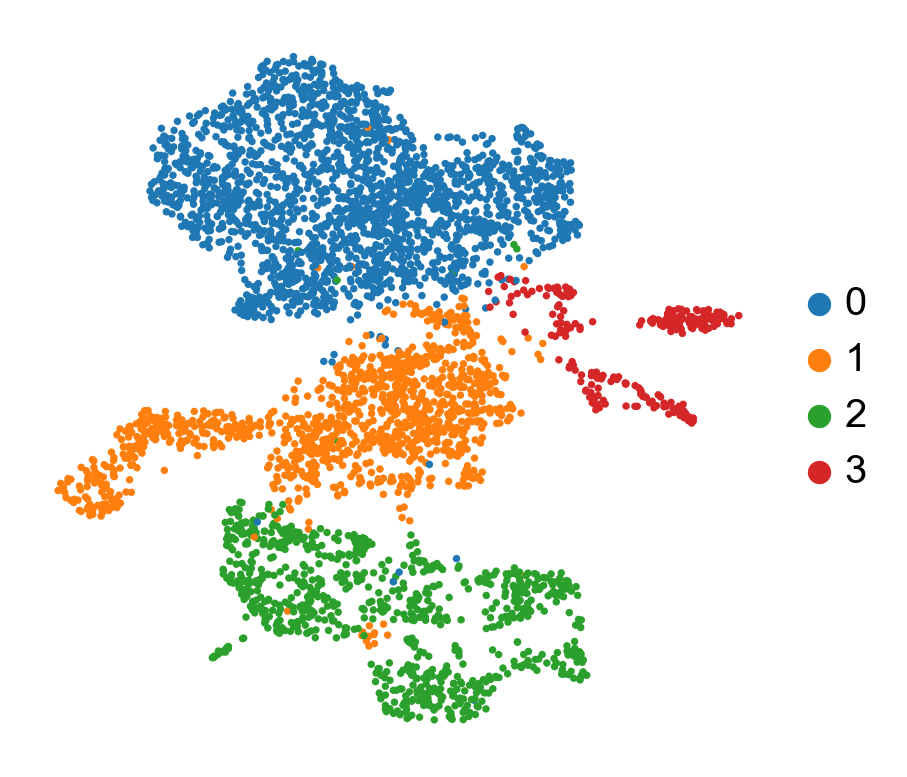

In [17]:
with rc_context({'figure.figsize': (4, 4), 'figure.facecolor': '#FFFFFF', 'savefig.dpi': '300'}):
    sc.pl.umap(adata, color=['louvain_3rd'], title='', size=20, legend_fontsize=12, frameon=False, legend_loc='right margin', show=True, save='_01_louvain_3rd.pdf')

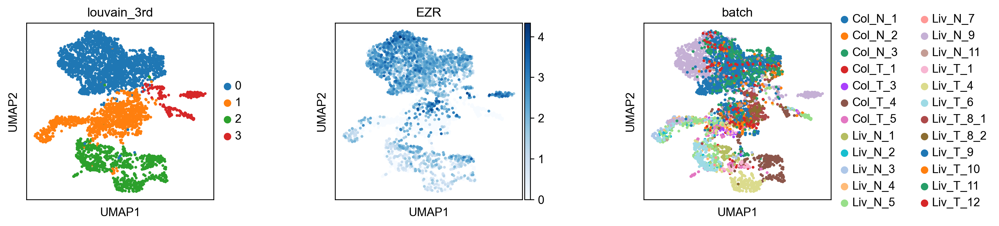

In [18]:
sc.pl.umap(adata, color=['louvain_3rd', 'EZR', 'batch'], cmap='Blues', wspace=0.5, legend_loc='right margin', show=True)

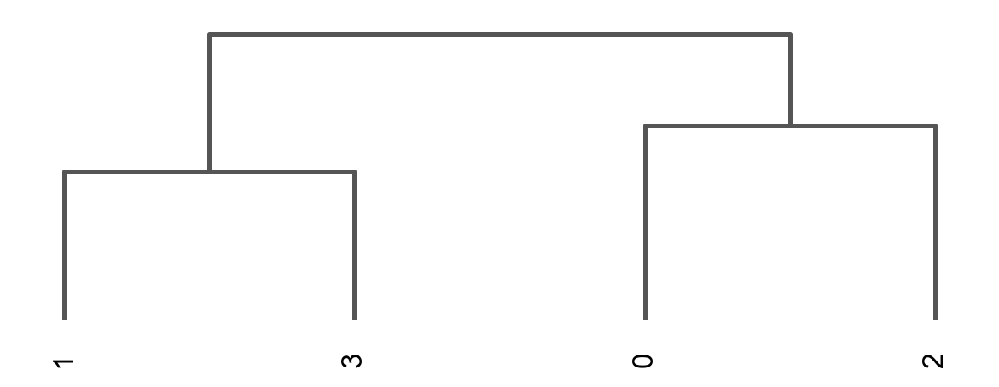

In [19]:
with rc_context({'figure.figsize': (6, 2), 'figure.facecolor': '#FFFFFF', 'savefig.dpi': '300'}):
    sc.tl.dendrogram(adata, groupby = 'louvain_3rd', cor_method='pearson')
    ax = sc.pl.dendrogram(adata, groupby = 'louvain_3rd', show=True, save="_01_louvain_3rd_cluster.pdf")
    # ax = sc.pl.correlation_matrix(adata, 'louvain_3rd', figsize=(10, 9), show=True, save="_01_correlation.pdf")

## Macrophage clusters

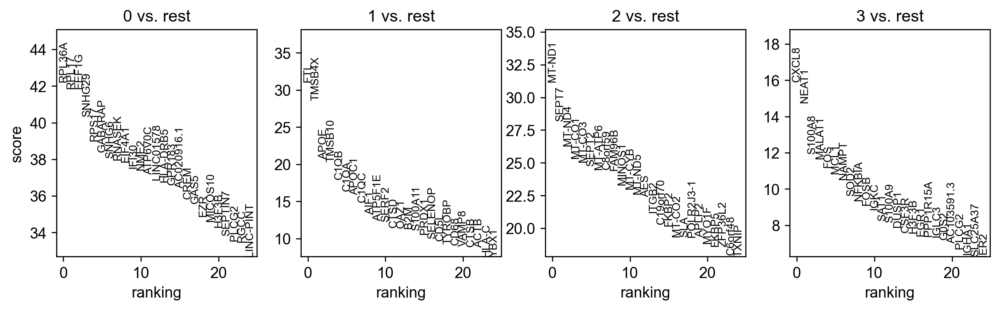

In [20]:
sc.pp.log1p(adata)

sc.tl.rank_genes_groups(adata, 'louvain_3rd', method='wilcoxon', pts=True)
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False, show=True)

res = pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(500)
res.to_csv("/Users/xuewei/ZxProjects/CRC/2023_GSE231559/01_preprocessing/32_Macrophage_Figures/32_Macrophage_diff_top500.csv")

In [21]:
# with rc_context({'figure.figsize': (3, 2), 'figure.facecolor':'#FFFFFF', 'savefig.dpi': '300', 'axes.grid':'False', 'legend.loc':'best'}):
# # Macrophage N-type [c48_Mph−FCN1, c51_Mph−PLTP, c52_Mph−CXCL12]
#     sc.pl.violin(adata, ['S100A9', 'S100A8', 'THBS1', 'VCAN'], groupby='louvain_3rd', rotation=90, swap_axes=True, show=True)
#     sc.pl.violin(adata, ['PLTP', 'LYVE1', 'STAB1', 'CETP'], groupby='louvain_3rd', rotation=90, swap_axes=True, show=True)
#     sc.pl.violin(adata, ['CXCL12', 'CD5L', 'LIPA', 'SDC3'], groupby='louvain_3rd', rotation=90, swap_axes=True, show=True)

In [22]:
# with rc_context({'figure.figsize': (3, 2), 'figure.facecolor':'#FFFFFF', 'savefig.dpi': '300', 'axes.grid':'False', 'legend.loc':'best'}):
# # Macrophage C-type [c49_Mph−NLRP3]
#     sc.pl.violin(adata, ['NLRP3', 'CCL20', 'PTGS2', 'EREG'], groupby='louvain_3rd', rotation=90, swap_axes=True, show=True)

In [23]:
# with rc_context({'figure.figsize': (3, 2), 'figure.facecolor':'#FFFFFF', 'savefig.dpi': '300', 'axes.grid':'False', 'legend.loc':'best'}):
# # Macrophage M-type [c53_Mph−C1QC, c54_Mph−SPP1, c55_Mph−MKI67]
#     sc.pl.violin(adata, ['C1QA', 'C1QB', 'C1QC'], groupby='louvain_3rd', rotation=90, swap_axes=True, show=True)
#     sc.pl.violin(adata, ['APOE', 'TREM2', 'MS4A4A'], groupby='louvain_3rd', rotation=90, swap_axes=True, show=True)
#     sc.pl.violin(adata, ['SPP1', 'FN1', 'CLEC5A', 'OLR1', 'IL1RN'], groupby='louvain_3rd', rotation=90, swap_axes=True, show=True)
#     sc.pl.violin(adata, ['MKI67', 'BIRC5', 'STMN1', 'CDC20'], groupby='louvain_3rd', rotation=90, swap_axes=True, show=True)

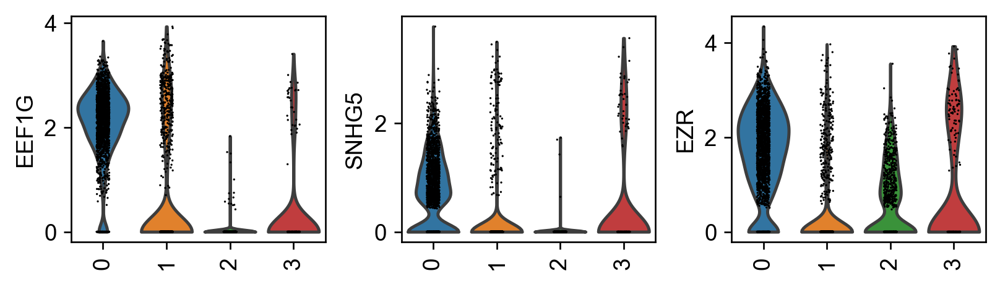

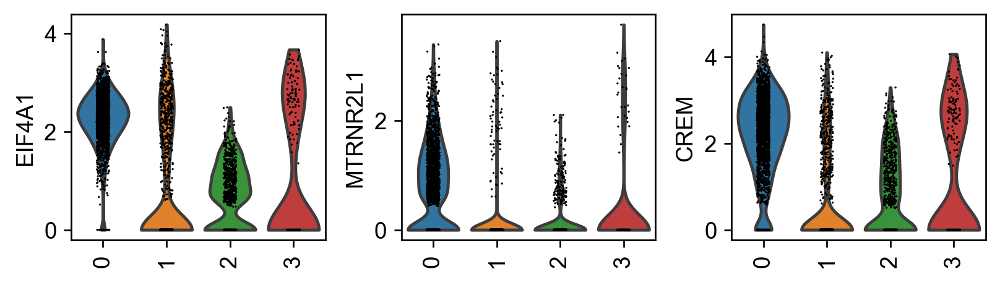

In [24]:
# Mph-EZR M type
with rc_context({'figure.figsize': (3, 2), 'figure.facecolor':'#FFFFFF', 'savefig.dpi': '300', 'axes.grid':'False', 'legend.loc':'best'}):
    sc.pl.violin(adata, ['EEF1G', 'SNHG5', 'EZR'], groupby='louvain_3rd', rotation=90, swap_axes=True, show=True)
    sc.pl.violin(adata, ['EIF4A1', 'MTRNR2L1', 'CREM'], groupby='louvain_3rd', rotation=90, swap_axes=True, show=True)

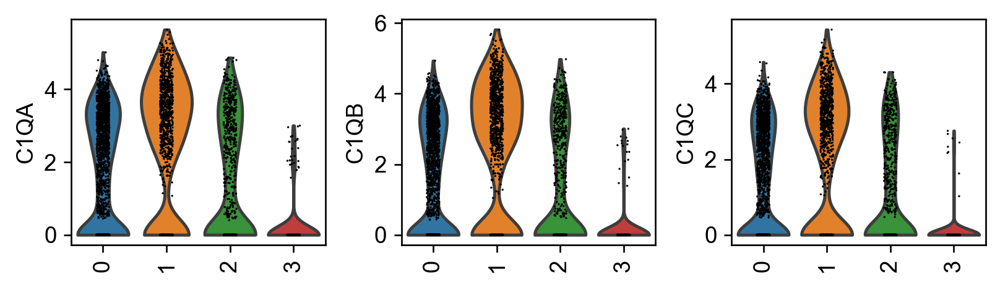

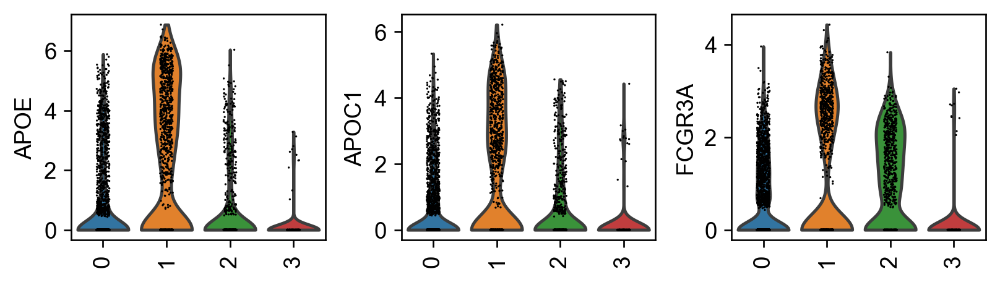

In [25]:
# Mph-C1QC N type
with rc_context({'figure.figsize': (3, 2), 'figure.facecolor':'#FFFFFF', 'savefig.dpi': '300', 'axes.grid':'False', 'legend.loc':'best'}):
    sc.pl.violin(adata, ['C1QA', 'C1QB', 'C1QC'], groupby='louvain_3rd', rotation=90, swap_axes=True, show=True)
    sc.pl.violin(adata, ['APOE', 'APOC1', 'FCGR3A'], groupby='louvain_3rd', rotation=90, swap_axes=True, show=True)
    # sc.pl.violin(adata, ['GPNMB', 'SLC40A1', 'LIPA'], groupby='louvain_3rd', rotation=90, swap_axes=True, show=True)

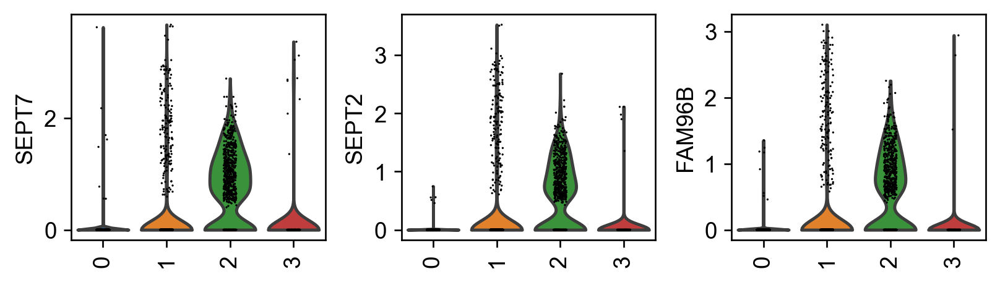

In [26]:
# Mph-SEPT2 M type
with rc_context({'figure.figsize': (3, 2), 'figure.facecolor':'#FFFFFF', 'savefig.dpi': '300', 'axes.grid':'False', 'legend.loc':'best'}):
    sc.pl.violin(adata, ['SEPT7', 'SEPT2', 'FAM96B'], groupby='louvain_3rd', rotation=90, swap_axes=True, show=True)
    # sc.pl.violin(adata, ['AES', 'MYO1F', 'FKBP2'], groupby='louvain_3rd', rotation=90, swap_axes=True, show=True)

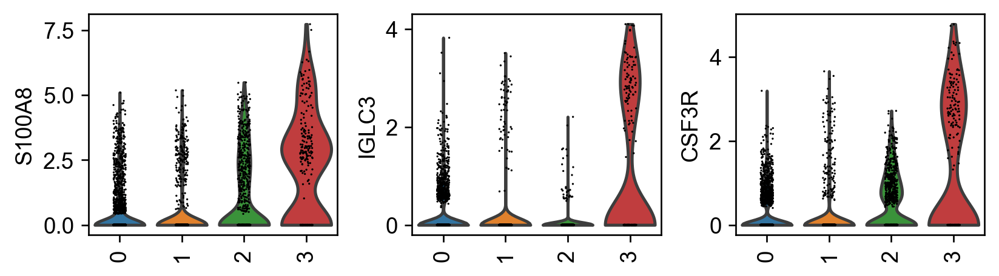

In [27]:
# Mph−S100A8 M type
with rc_context({'figure.figsize': (3, 2), 'figure.facecolor':'#FFFFFF', 'savefig.dpi': '300', 'axes.grid':'False', 'legend.loc':'best'}):
    sc.pl.violin(adata, ['S100A8', 'IGLC3', 'CSF3R'], groupby='louvain_3rd', rotation=90, swap_axes=True, show=True)
    # sc.pl.violin(adata, ['S100A9', 'EGR1', 'IGKC'], groupby='louvain_3rd', rotation=90, swap_axes=True, show=True)

In [28]:
# with rc_context({'figure.figsize': (4, 2.5), 'figure.facecolor':'#FFFFFF', 'savefig.dpi': '300', 'axes.grid':'False', 'legend.loc':'best'}):
# # Macrophage
#     sc.pl.violin(adata, ['CD14', 'CD68', 'MS4A7'], groupby='louvain_3rd', rotation=90, swap_axes=True, show=True)

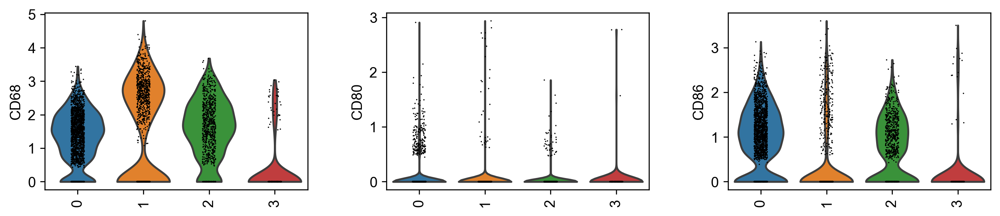

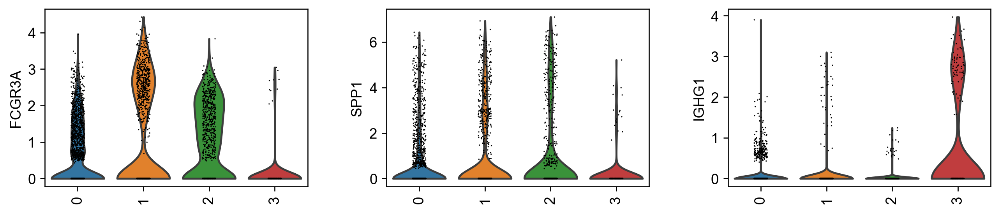

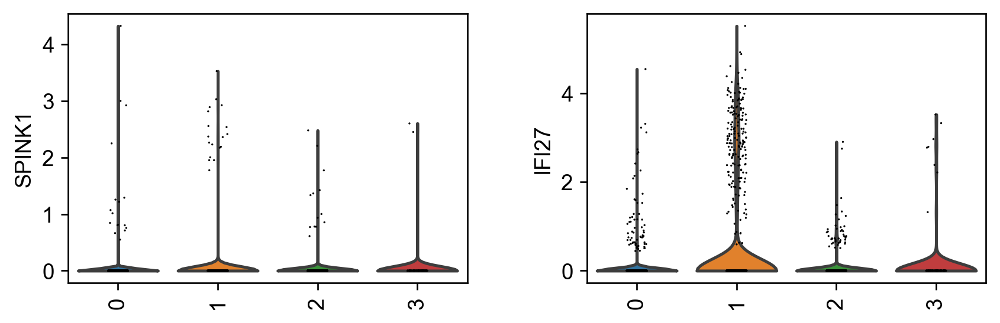

In [29]:
with rc_context({'figure.figsize': (4, 2.5), 'figure.facecolor':'#FFFFFF', 'savefig.dpi': '300', 'axes.grid':'False', 'legend.loc':'best'}):
# Macrophage M1
    sc.pl.violin(adata, ['CD68', 'CD80', 'CD86'], groupby='louvain_3rd', rotation=90, swap_axes=True, show=True)
    sc.pl.violin(adata, ['FCGR3A', 'SPP1', 'IGHG1'], groupby='louvain_3rd', rotation=90, swap_axes=True, show=True)
    sc.pl.violin(adata, ['SPINK1', 'IFI27'], groupby='louvain_3rd', rotation=90, swap_axes=True, show=True)

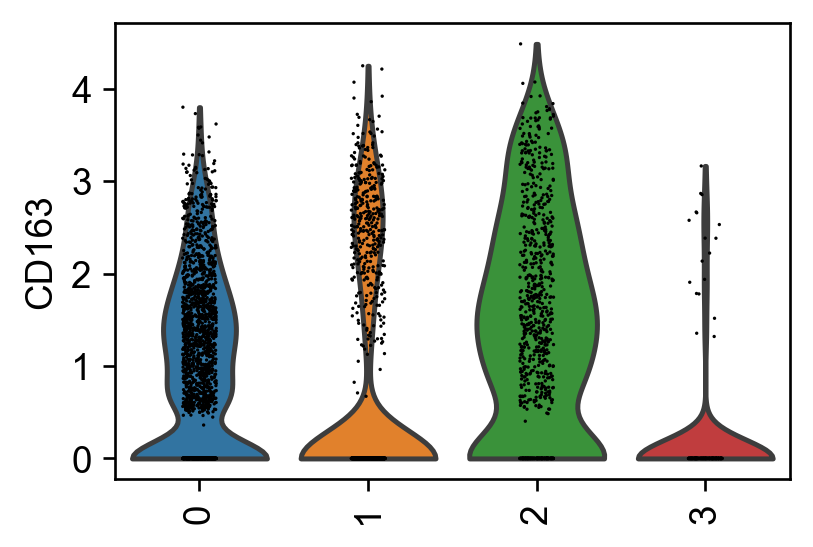

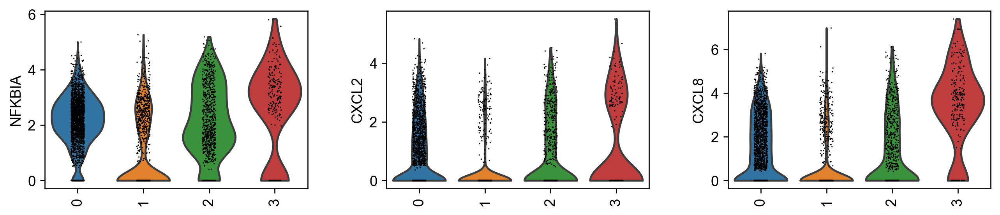

In [30]:
with rc_context({'figure.figsize': (4, 2.5), 'figure.facecolor':'#FFFFFF', 'savefig.dpi': '300', 'axes.grid':'False', 'legend.loc':'best'}):
# Macrophage M2 [TAM, pro-metastasis]
    sc.pl.violin(adata, ['CD163'], groupby='louvain_3rd', rotation=90, swap_axes=True, show=True)
    sc.pl.violin(adata, ['NFKBIA', 'CXCL2', 'CXCL8'], groupby='louvain_3rd', rotation=90, swap_axes=True, show=True)

In [31]:
# with rc_context({'figure.figsize': (5, 2.5), 'figure.facecolor':'#FFFFFF', 'savefig.dpi': '300', 'axes.grid':'False', 'legend.loc':'best'}):
#     categories_order=['0','1','9','8','2','5','4','7','3','6','10']
#     sc.pl.violin(adata,['APOE', 'C1QA', 'C1QB'],groupby='louvain_3rd', order=categories_order, xlabel="Cluster number", rotation=90, swap_axes=True, show=True)

In [32]:
# M2: '0', '2'; 'Mph-EEF1G', 'Mph-SEPT2';
# M1: '1'; 'Mph-C1QC';
# Unclear: '3'; 'Mph-S100A8';
adata.obs['Macrophage_cluster'] = adata.obs['louvain_3rd'].replace(
    ['0', '1', '2', '3'
    ],
    ['Mph-EEF1G', 'Mph-C1QC', 'Mph-SEPT2', 'Mph-S100A8'
    ])

In [33]:
adata.obs['Macrophage_cluster'].cat.categories

Index(['Mph-EEF1G', 'Mph-C1QC', 'Mph-SEPT2', 'Mph-S100A8'], dtype='object')

In [34]:
# adata.obs['Macrophage_cluster'].cat.reorder_categories(
#     ['Mph-EEF1G', 'Mph-C1QC', 'Mph-SEPT2', 'Mph-S100A8'], inplace=True, ordered=True)
# adata.obs['Macrophage_cluster'].cat.categories

In [35]:
# sc.tl.pca(adata, svd_solver='arpack', n_comps=40)
# sc.pp.neighbors(adata, n_neighbors=10, n_pcs=40)
# sc.tl.tsne(adata)
sc.tl.umap(adata)

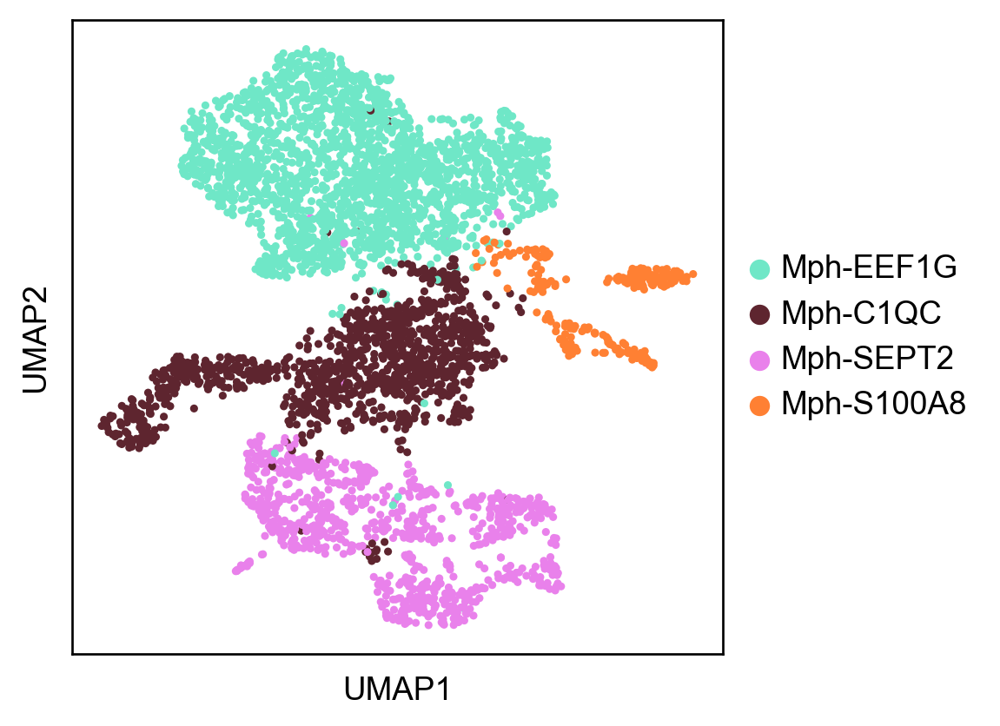

In [36]:
with rc_context({'figure.figsize': (4, 4), 'figure.facecolor':'#FFFFFF', 'savefig.dpi': '300', 'axes.grid':'False', 'legend.loc':'best'}):
    sc.pl.umap(adata, color=['Macrophage_cluster'], legend_loc='right margin', title='', size=30,
    palette=['#6fe7c7', '#5e252f', '#e981eb', '#ff8033'], show=True, save='_02_Macrophage_cluster_v1.pdf')
    adata.uns['Macrophage_cluster_colors']

In [37]:
# sc.pl.tsne(adata, color=['Macrophage_cluster'], legend_loc='right margin', title='', size=30,
#     palette=['#6fe7c7', '#5e252f', '#e981eb', '#ff8033'], show=True, save='_02_cluster_v1.pdf')

In [38]:
adata

AnnData object with n_obs × n_vars = 4319 × 13401
    obs: 'batch', 'n_genes_by_counts', 'total_counts', 'n_genes', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'n_counts_all', 'umap_density_batch', 'louvain', 'sample', 'louvain_anno', 'louvain_2nd', 'Myeloid_cluster', 'louvain_3rd', 'Macrophage_cluster'
    var: 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'mt', 'ribo', 'hb', 'log1p_mean_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'n_counts', 'mean', 'std'
    uns: 'Myeloid_cluster_colors', 'batch_colors', 'dendrogram_louvain_2nd', 'draw_graph', 'hvg', 'log1p', 'louvain', 'louvain_2nd_colors', 'louvain_anno_colors', 'louvain_colors', 'neighbors', 'pca', 'sample_colors', 'uma

In [39]:
adata.write_h5ad('/Users/xuewei/ZxProjects/CRC/2023_GSE231559/01_preprocessing/write/CRC_32_Macrophage.h5ad')

## DEGs in Myeloid cells

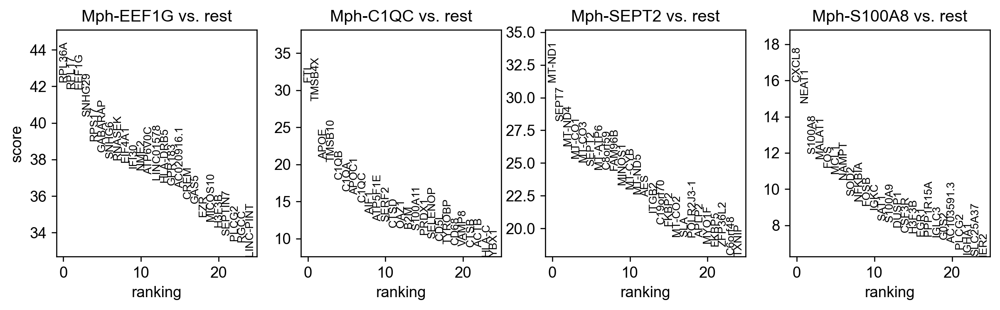

In [40]:
sc.pp.log1p(adata)

sc.tl.rank_genes_groups(adata, 'Macrophage_cluster', method='wilcoxon', pts=True)
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False, show=True)

res = pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(500)
res.to_csv("/Users/xuewei/ZxProjects/CRC/2023_GSE231559/01_preprocessing/32_Macrophage_Figures/32_Macrophage_diff_top500.csv")

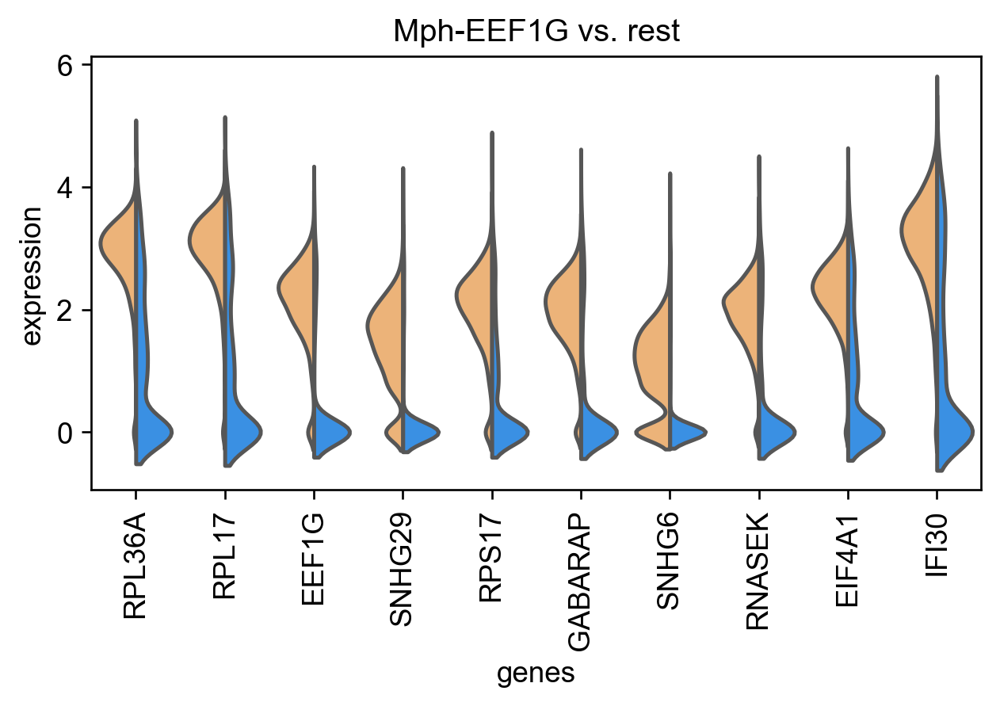

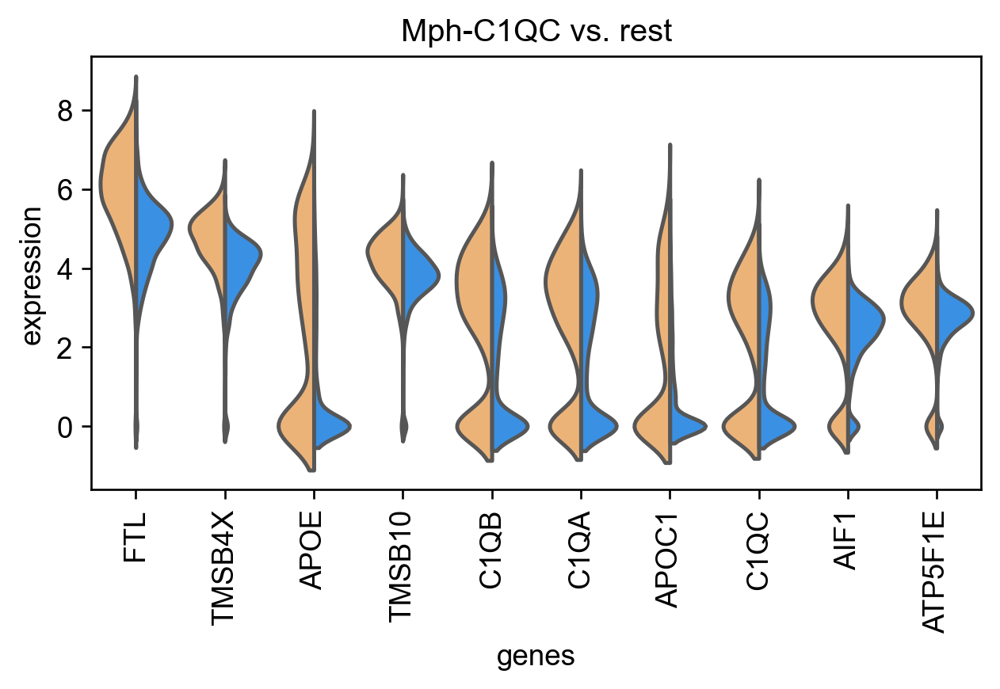

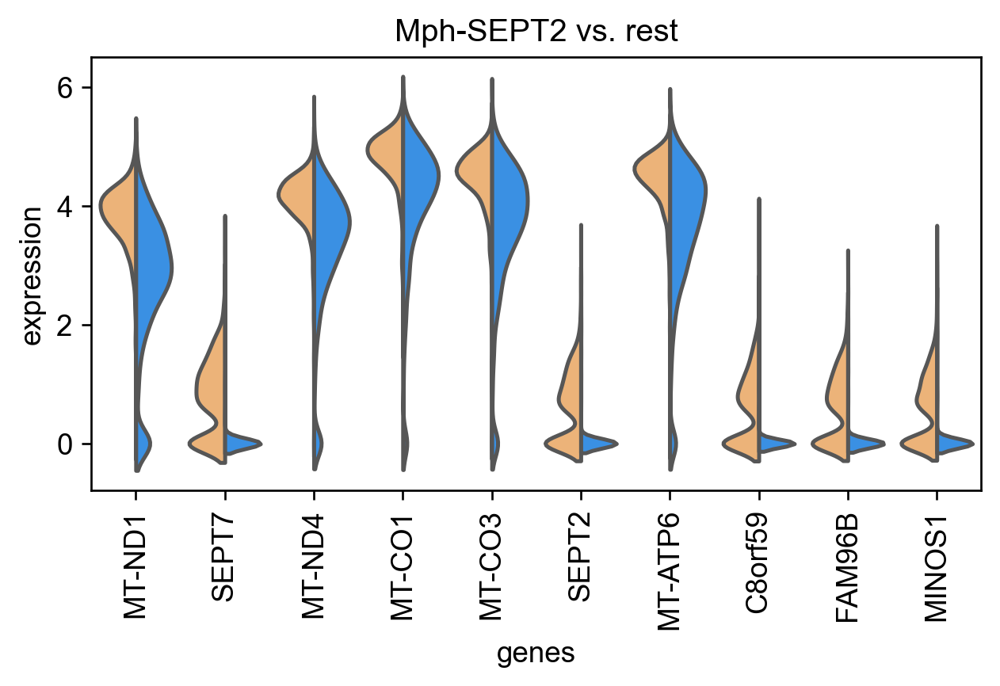

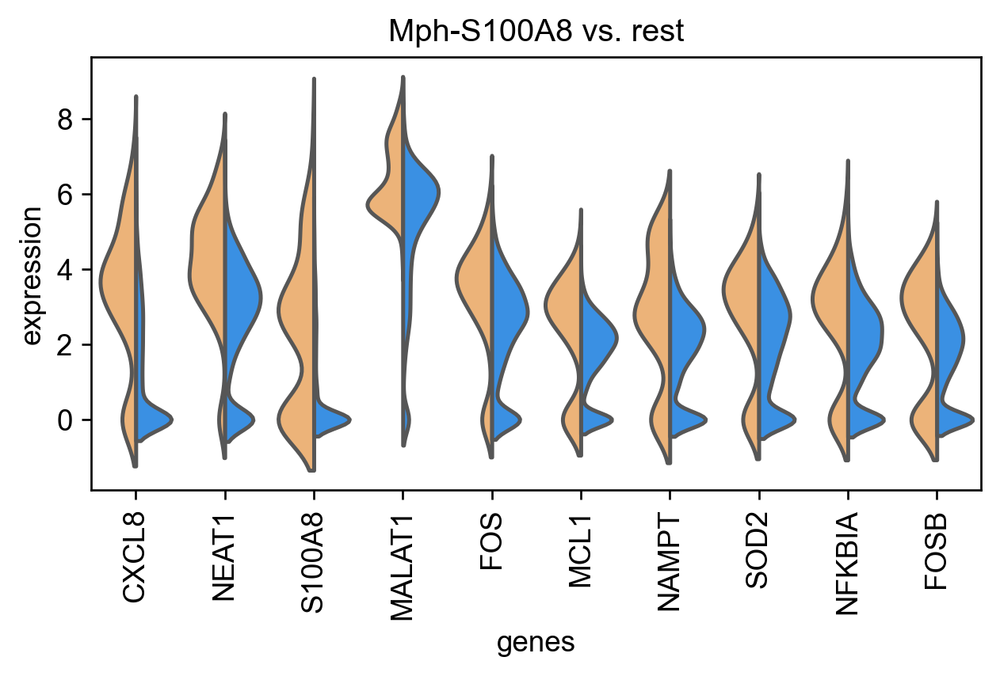

In [41]:
from cycler import cycler
with rc_context({'figure.figsize': (6, 3), 'figure.facecolor': '#FFFFFF', 'savefig.dpi': '300', 'axes.grid': 'False', 'legend.loc':'best',
'axes.prop_cycle': cycler(color=['#ffb366', '#1e90ff']), 'axes.labelcolor': '#000000', }):
    sc.pl.rank_genes_groups_violin(adata, groups=['Mph-EEF1G', 'Mph-C1QC', 'Mph-SEPT2', 'Mph-S100A8'], n_genes=10, strip=False, jitter=0, show=True)

In [42]:
res_Mph_EEF1G = sc.get.rank_genes_groups_df(adata, group='Mph-EEF1G')
res_Mph_EEF1G.to_csv("32_diff_1_res_Mph-EEF1G_df.csv")

res_Mph_EEF1G = sc.queries.enrich(adata, "Mph-EEF1G")
res_Mph_EEF1G.to_csv("32_diff_1_res_Mph-EEF1G_enrich.csv")

In [43]:
res_Mph_C1QC = sc.get.rank_genes_groups_df(adata, group='Mph-C1QC')
res_Mph_C1QC.to_csv("32_diff_2_res_Mph-C1QC_df.csv")

res_Mph_C1QC = sc.queries.enrich(adata, "Mph-C1QC")
res_Mph_C1QC.to_csv("32_diff_2_res_Mph-C1QC_enrich.csv")

In [44]:
res_Mph_SEPT2 = sc.get.rank_genes_groups_df(adata, group='Mph-SEPT2')
res_Mph_SEPT2.to_csv("32_diff_3_res_Mph-SEPT2_df.csv")

res_Mph_SEPT2 = sc.queries.enrich(adata, "Mph-SEPT2")
res_Mph_SEPT2.to_csv("32_diff_3_res_Mph-SEPT2_enrich.csv")

In [45]:
res_Mph_S100A8 = sc.get.rank_genes_groups_df(adata, group='Mph-S100A8')
res_Mph_S100A8.to_csv("32_diff_4_res_Mph-S100A8_df.csv")

res_Mph_S100A8 = sc.queries.enrich(adata, "Mph-S100A8")
res_Mph_S100A8.to_csv("32_diff_4_res_Mph-S100A8_enrich.csv")

## Figures in manuscripts

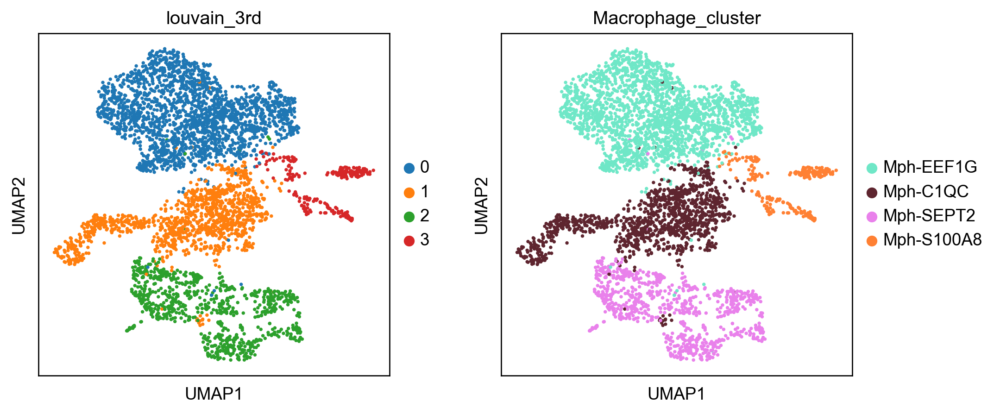

In [46]:
with rc_context({'figure.figsize': (4, 4), 'figure.facecolor':'#FFFFFF', 'savefig.dpi': '300', 'axes.grid':'False', 'legend.loc':'best'}):
    ax = sc.pl.umap(adata, color=['louvain_3rd', 'Macrophage_cluster'], ncols=2, wspace=0.2, size=20, legend_loc='right margin', show=True, save="_03_Macrophage_v1.pdf")

In [47]:
marker_genes = {
    'Mph-EEF1G': ['EEF1G', 'SNHG5', 'EZR'],
    'Mph-C1QC': ['C1QA', 'C1QB', 'C1QC'],
    'Mph-SEPT2': ['SEPT7', 'SEPT2', 'FAM96B'],
    'Mph-S100A8': ['S100A8', 'IGLC3', 'CSF3R'],
    }

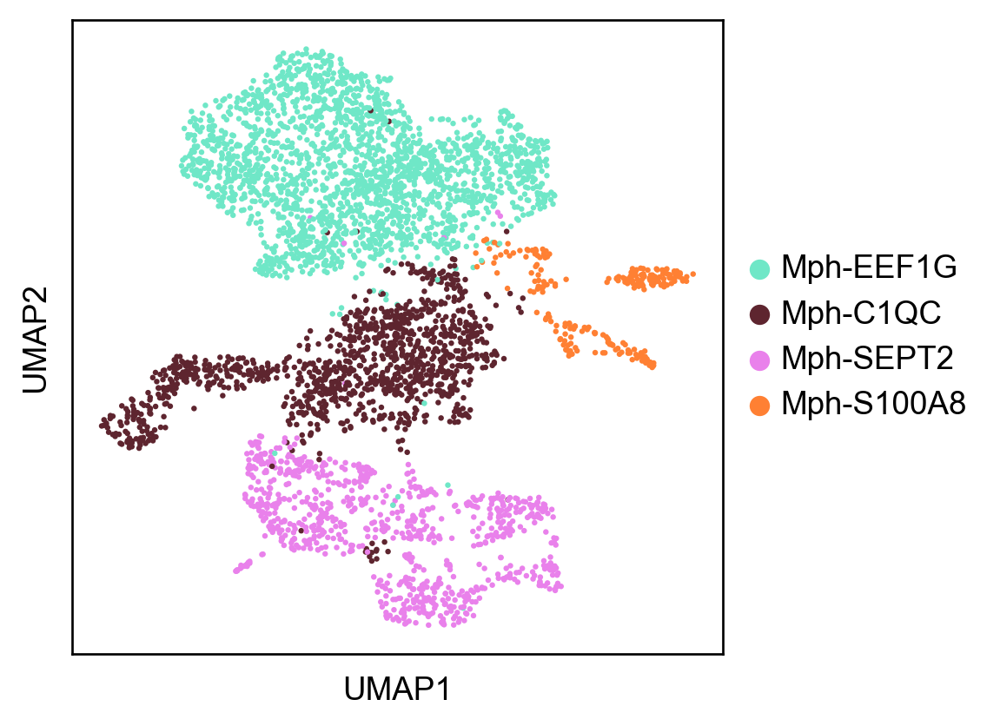

In [48]:
with rc_context({'figure.figsize': (4, 4), 'figure.facecolor':'#FFFFFF', 'savefig.dpi': '300', 'axes.grid':'False', 'legend.loc':'best'}):
    sc.pl.umap(adata, color=['Macrophage_cluster'], legend_loc='right margin', size=15, show=True, title='', save='_05_Macrophage_cluster.pdf')
    # sc.pl.tsne(adata, color=['Myeloid_cluster'], legend_loc='right margin', size=30, show=True, title='', save='_05_Myeloid_cluster.pdf')

In [49]:
color_loc_1 = mpl.colors.LinearSegmentedColormap.from_list('blue', [(0, '#FFFFFF'), (1, '#fd5f00')], N=256)

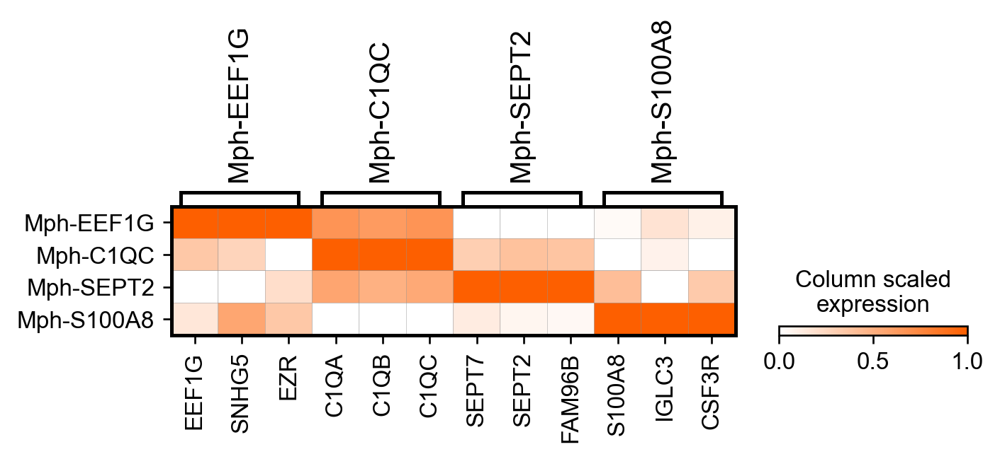

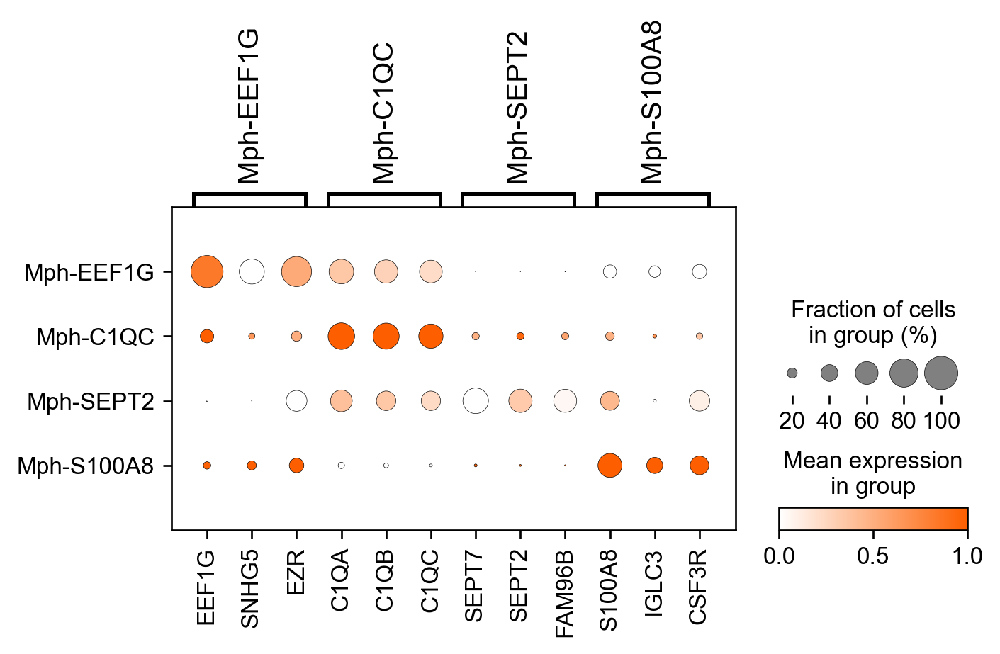

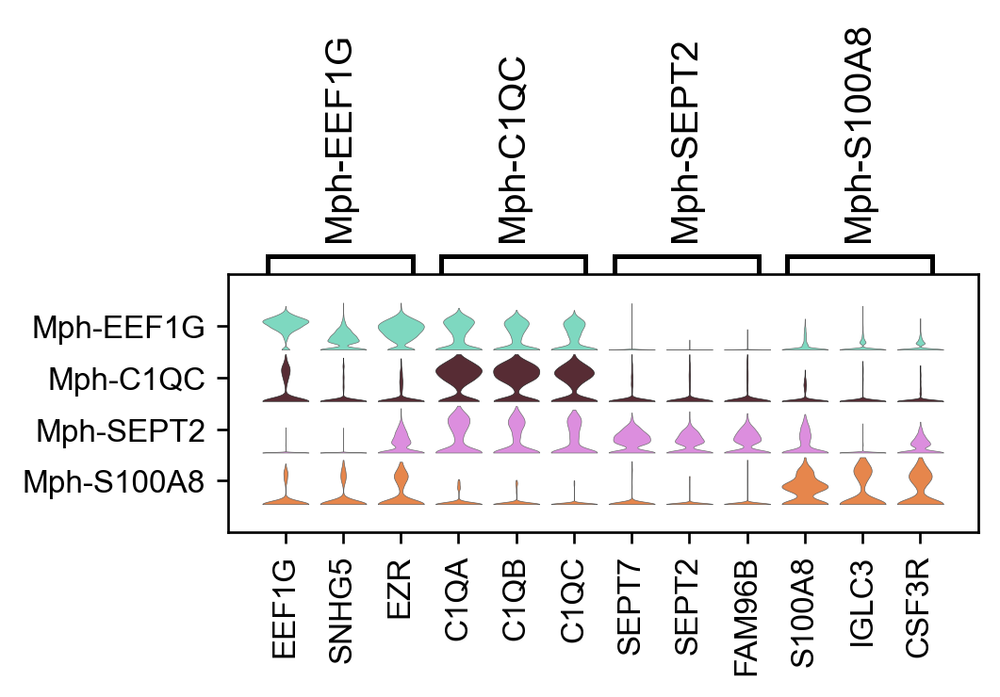

In [50]:
with rc_context({'figure.figsize': (6, 3), 'figure.facecolor':'#FFFFFF', 'savefig.dpi': '300', 'axes.grid':'False', 'legend.loc':'best'}):
    sc.pl.matrixplot(adata, marker_genes, 'Macrophage_cluster', dendrogram=False, cmap=color_loc_1, standard_scale='var', figsize=(6, 1), use_raw=True,
    colorbar_title='Column scaled\nexpression', show=True, save="05_Macrophage_clusters.pdf")

with rc_context({'figure.figsize': (6, 3), 'figure.facecolor':'#FFFFFF', 'savefig.dpi': '300', 'axes.grid':'False', 'legend.loc':'best'}):
    sc.pl.dotplot(adata, marker_genes, groupby='Macrophage_cluster', cmap=color_loc_1, swap_axes=False, dendrogram=False, figsize=(6, 2.5), use_raw=True,
    mean_only_expressed=True, standard_scale='var', show=True, save="05_Macrophage_clusters.pdf")

with rc_context({'figure.figsize': (6, 3), 'figure.facecolor':'#FFFFFF', 'savefig.dpi': '300', 'axes.grid':'False', 'legend.loc':'best'}):
    sc.pl.stacked_violin(adata, marker_genes, groupby='Macrophage_cluster', values_to_plot='logfoldchanges', var_group_rotation=90, rotation=0, vmax=1, vmin=-1, figsize=(6, 1.5), use_raw=True,
    row_palette=['#6fe7c7', '#5e252f', '#e981eb', '#ff8033'],
    standard_scale='var', mean_only_expressed=True, swap_axes=False, dendrogram=False, show=True, save="05_Macrophage_colors.pdf")

# with rc_context({'figure.figsize': (12, 3), 'figure.facecolor':'#FFFFFF', 'savefig.dpi': '300', 'axes.grid':'False', 'legend.loc':'best'}):
#     sc.pl.stacked_violin(adata, marker_genes, cmap=color_loc_1, groupby='Myeloid_cluster', 
#     use_raw=True, rotation=90, standard_scale='var', mean_only_expressed=True, show=True, save="05_Myeloid_colors_auto.pdf")

In [51]:
green_color_normal = mpl.colors.LinearSegmentedColormap.from_list('blue', 
                                             [(0,    '#50C1E9'),
                                              (0.5,  '#FFFFFF'),
                                              (1,    '#fd5f00')], N=256)

In [52]:
# sc.tl.dendrogram(adata, 'Myeloid_cluster', n_pcs=40)
# sc.pl.correlation_matrix(adata, 'Myeloid_cluster', cmap=green_color_normal, figsize=(4, 2.5), show=True, save='_05_Myeloid_cluster_correlation.pdf')

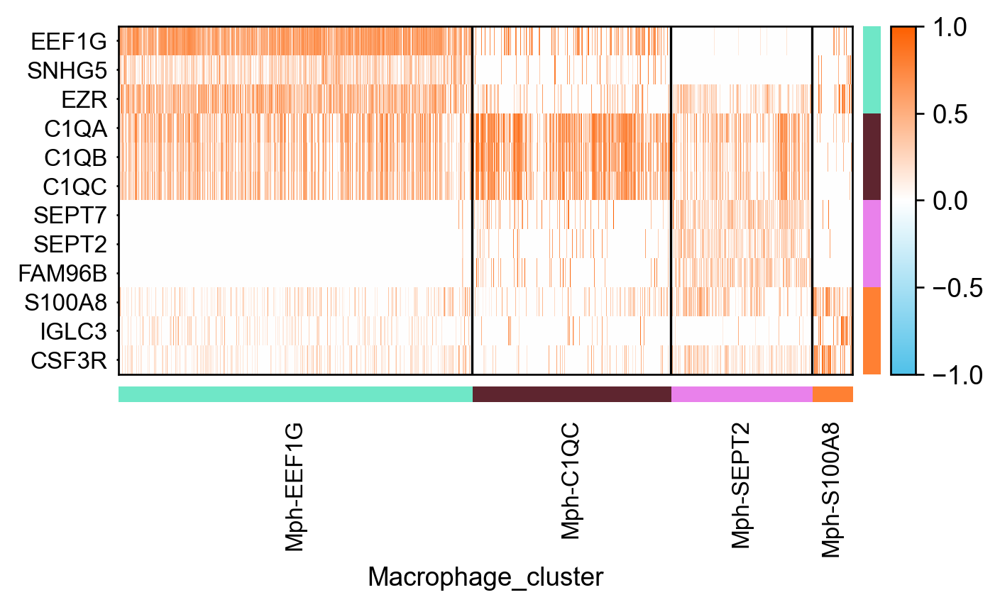

In [53]:
with rc_context({'figure.figsize': (6, 3), 'figure.facecolor':'#FFFFFF', 'savefig.dpi': '300', 'axes.grid':'False', 'legend.loc':'best'}):
    sc.pl.heatmap(adata, marker_genes, groupby='Macrophage_cluster', show_gene_labels=True, figsize=(6, 3), 
        swap_axes=True, vmax=1, vmin=-1, cmap=green_color_normal, standard_scale='var', dendrogram=False, save='_05_Macrophage_cluster.pdf')

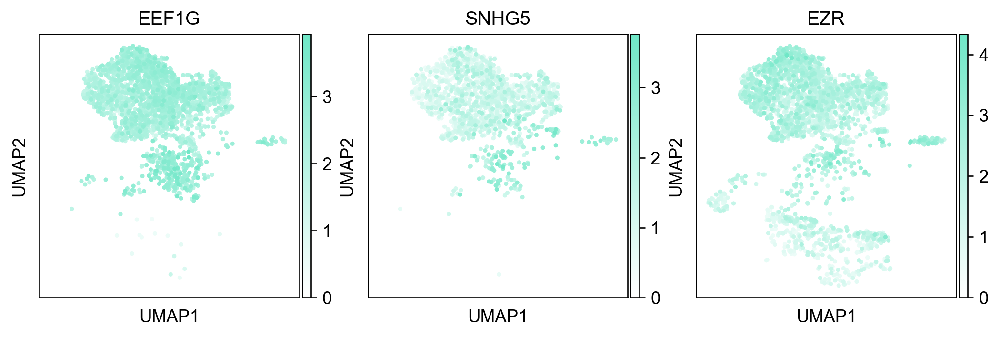

In [54]:
color_loc_1 = mpl.colors.LinearSegmentedColormap.from_list('1', [(0, '#FFFFFF'), (1, '#6fe7c7')], N=256)
sc.pl.umap(adata, color=['EEF1G', 'SNHG5', 'EZR',], ncols=5, wspace=0.15, size=30, # legend_loc='on data', 
    cmap=color_loc_1, frameon=True, show=True, save='_05_01_Mph-EEF1G.pdf')

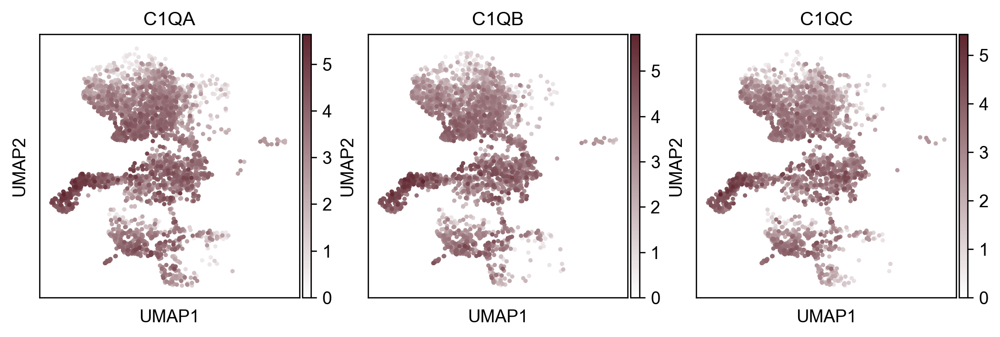

In [55]:
color_loc_2 = mpl.colors.LinearSegmentedColormap.from_list('1', [(0, '#FFFFFF'), (1, '#5e252f')], N=256)
sc.pl.umap(adata, color=['C1QA', 'C1QB', 'C1QC'], ncols=5, wspace=0.15, size=30, # legend_loc='on data', 
    cmap=color_loc_2, frameon=True, show=True, save='_05_02_Mph-C1QC.pdf')

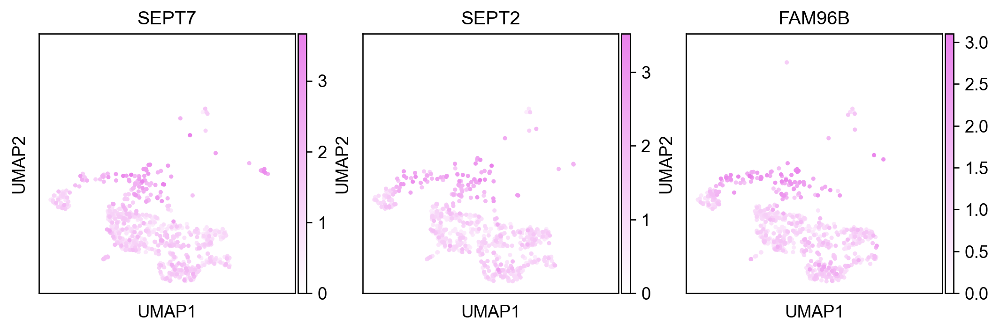

In [56]:
color_loc_3 = mpl.colors.LinearSegmentedColormap.from_list('1', [(0, '#FFFFFF'), (1, '#e981eb')], N=256)
sc.pl.umap(adata, color=['SEPT7', 'SEPT2', 'FAM96B'], ncols=5, wspace=0.15, size=30, # legend_loc='on data', 
    cmap=color_loc_3, frameon=True, show=True, save='_05_03_Mph-SEPT2.pdf')

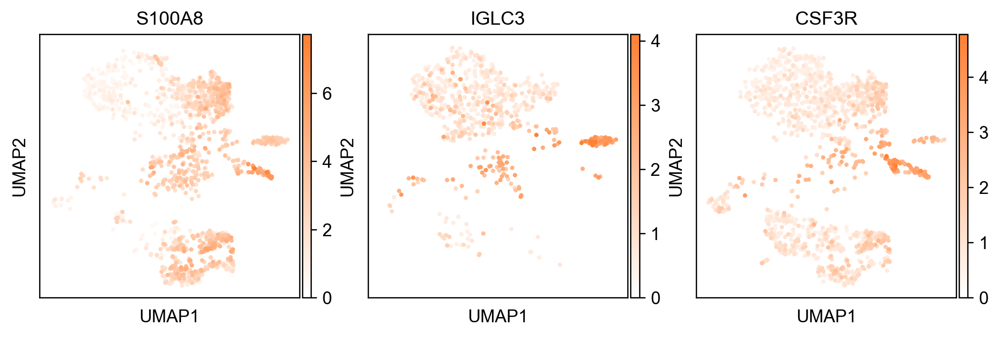

In [57]:
color_loc_4 = mpl.colors.LinearSegmentedColormap.from_list('1', [(0, '#FFFFFF'), (1, '#ff8033')], N=256)
sc.pl.umap(adata, color=['S100A8', 'IGLC3', 'CSF3R'], ncols=5, wspace=0.15, size=30, # legend_loc='on data', 
    cmap=color_loc_4, frameon=True, show=True, save='_05_04_Mph-S100A8.pdf')

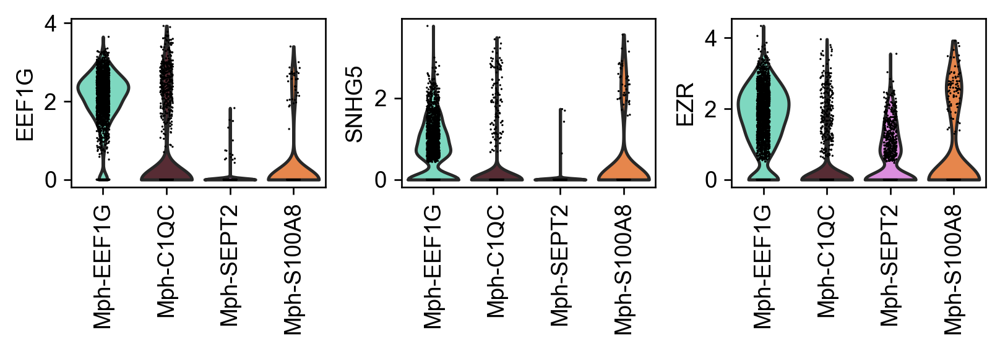

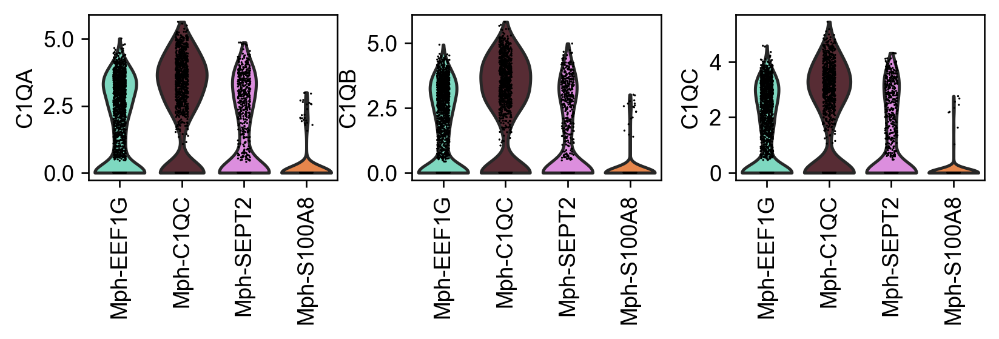

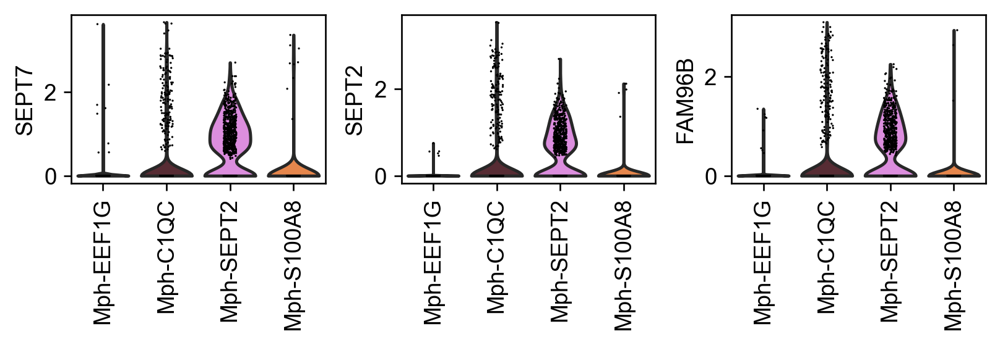

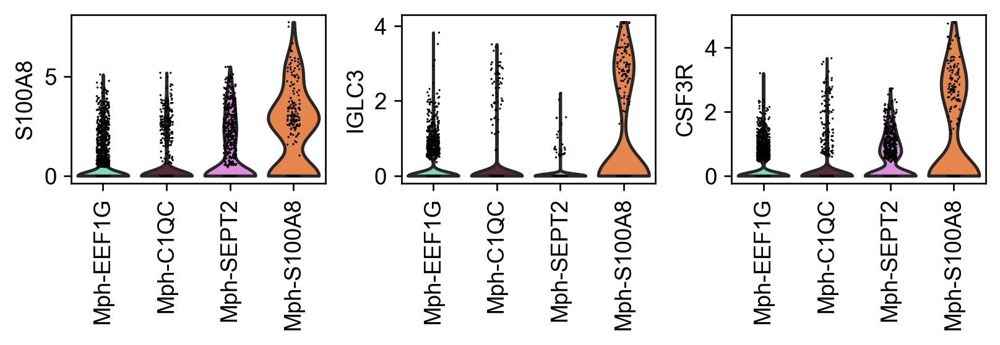

In [58]:
with rc_context({'figure.figsize': (3, 1.5), 'figure.facecolor':'#FFFFFF', 'savefig.dpi': '300', 'axes.grid':'False', 'legend.loc':'best'}):
    sc.pl.violin(adata, ['EEF1G', 'SNHG5', 'EZR'], groupby='Macrophage_cluster', rotation=90, swap_axes=True, show=True, save="_05_01_Mph-EEF1G_v1.pdf")
    sc.pl.violin(adata, ['C1QA', 'C1QB', 'C1QC'], groupby='Macrophage_cluster', rotation=90, swap_axes=True, show=True, save="_05_02_Mph-C1QC_v1.pdf")
    sc.pl.violin(adata, ['SEPT7', 'SEPT2', 'FAM96B'], groupby='Macrophage_cluster', rotation=90, swap_axes=True, show=True, save="_05_03_Mph-SEPT2_v1.pdf")
    sc.pl.violin(adata, ['S100A8', 'IGLC3', 'CSF3R'], groupby='Macrophage_cluster', rotation=90, swap_axes=True, show=True, save="_05_04_Mph-S100A8_v1.pdf")

In [59]:
# marker_genes_Myeloid = {
#     'Neutrophils': ['CSF3R', 'AQP9', 'NEDD9'],
#     'Mast cells': ['CPA3', 'KIT', 'MS4A2'],
#     'Macrophage': ['CD14', 'CD68', 'CD74'],
#     'cDC1': ['IDO1', 'LAMP3', 'S100B'],
#     'cDC2': ['CXCL5', 'MMP9', 'TAGLN'],
#     'pDC': ['IRF4', 'GZMB', 'PTGDS'],
#     # 'Monocytes': ['VCAN', 'FGL2', 'SAMHD1'],
#     # 'MDSC': ['CCL20', 'EREG', 'TIMP1'], 
#     # 'M1': ['APOE', 'APOC1', 'IFI27'], 
#     # 'M2': ['MRC1', 'SELENOP', 'CD163'], 
#     # 'M2-like': ['FCGR3A', 'PLXDC2', 'LRP1'],
#     # 'cDC1': ['XCR1', 'LAMP3', 'RUNX3'],
#     # 'cDC2': ['IL32', 'TAGLN', 'ACTA2'],
#     # 'pDC': ['TCF4', 'GZMB', 'LILRA4'], 
#     }
# color_matrixplot_1 = mpl.colors.LinearSegmentedColormap.from_list('blue', [(0, '#FFFFFF'), (1, '#003399')], N=256)
# sc.pl.matrixplot(adata, marker_genes_Myeloid, groupby='louvain_3rd', use_raw=True,
#     dendrogram=False, cmap=color_matrixplot_1, standard_scale='var', colorbar_title='Column scaled\nexpression', show=True, save="cluster.pdf")

## Plot of batch

In [60]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

In [61]:
adata.obs['batch'].value_counts()

Liv_T_9      1251
Liv_N_9       732
Col_T_4       271
Liv_T_11      252
Liv_T_8_1     244
Liv_T_4       226
Liv_N_5       194
Liv_T_6       155
Liv_T_8_2     145
Col_T_5       126
Liv_N_1       112
Liv_N_3        98
Liv_T_10       92
Liv_T_12       90
Liv_N_2        67
Col_T_3        53
Liv_N_4        51
Liv_T_1        38
Col_N_2        36
Liv_N_11       25
Col_N_3        25
Col_T_1        24
Col_N_1        10
Liv_N_7         2
Name: batch, dtype: int64

In [62]:
pd.set_option('display.max_rows', 10)
pd.set_option('display.max_columns', None)

In [63]:
adata.obs

,batch,n_genes_by_counts,total_counts,n_genes,log1p_n_genes_by_counts,log1p_total_counts,pct_counts_in_top_20_genes,total_counts_mt,log1p_total_counts_mt,pct_counts_mt,total_counts_ribo,log1p_total_counts_ribo,pct_counts_ribo,total_counts_hb,log1p_total_counts_hb,pct_counts_hb,n_counts_all,umap_density_batch,louvain,sample,louvain_anno,louvain_2nd,Myeloid_cluster,louvain_3rd,Macrophage_cluster
ATCGTAGTCCGTGACG-1,Col_N_1,442,916.0,442,6.093570,6.821107,40.393013,89.0,4.499810,9.716157,13.0,2.639057,1.419214,0.0,0.000000,0.000000,927.649597,0.110158,3,Col_N,Myeloid cells,6,Macrophage,3,Mph-S100A8
CAAGGGACAGAGGCTA-1,Col_N_1,326,712.0,326,5.789960,6.569481,45.786517,61.0,4.127134,8.567416,11.0,2.484907,1.544944,0.0,0.000000,0.000000,731.465454,0.113902,3,Col_N,Myeloid cells,6,Macrophage,3,Mph-S100A8
CAGCAATAGGACAGCT-1,Col_N_1,782,1448.0,782,6.663133,7.278629,20.165746,133.0,4.897840,9.185083,226.0,5.424950,15.607736,0.0,0.000000,0.000000,1339.269043,0.065946,3,Col_N,Myeloid cells,2,Macrophage,2,Mph-SEPT2
CATTGAGCAAAGGGCT-1,Col_N_1,2708,11213.0,2708,7.904335,9.324919,21.840721,1009.0,6.917706,8.998485,1874.0,7.536364,16.712744,0.0,0.000000,0.000000,2167.414307,0.073181,8,Col_N,Myeloid cells,3,Macrophage,2,Mph-SEPT2
GCACATAGTGACACGA-1,Col_N_1,1316,3105.0,1316,7.183112,8.041091,20.386473,282.0,5.645447,9.082126,486.0,6.188264,15.652174,0.0,0.000000,0.000000,1786.064697,0.063785,3,Col_N,Myeloid cells,3,Macrophage,2,Mph-SEPT2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTACGCCCAATTGAGA-1,Liv_T_12,916,2872.0,916,6.821107,7.963112,24.721448,3.0,1.386294,0.104457,875.0,6.775366,30.466574,0.0,0.000000,0.000000,1225.794189,0.010506,3,Liv_T,Myeloid cells,2,Macrophage,1,Mph-C1QC
TTACGTTAGGCTCACC-1,Liv_T_12,2836,14258.0,2836,7.950502,9.565144,20.823397,404.0,6.003887,2.833497,2651.0,7.883070,18.593069,1.0,0.693147,0.007014,2133.536133,0.020422,3,Liv_T,Myeloid cells,0,Macrophage,0,Mph-EEF1G
TTGAACGGTACTTCCC-1,Liv_T_12,911,2450.0,911,6.815640,7.804251,26.040816,224.0,5.416101,9.142857,385.0,5.955837,15.714286,1.0,0.693147,0.040816,1294.677856,0.019674,3,Liv_T,Myeloid cells,2,Macrophage,1,Mph-C1QC
TTGTTCATCCGCGGAT-1,Liv_T_12,337,1121.0,337,5.823046,7.022868,50.401427,108.0,4.691348,9.634254,142.0,4.962845,12.667261,0.0,0.000000,0.000000,556.812134,0.025232,3,Liv_T,Myeloid cells,2,Macrophage,1,Mph-C1QC


### Label with Sample

In [64]:
'Liv_T_9', 'Liv_N_9', 'Col_T_4', 'Liv_T_11', 'Liv_T_8_1', 'Liv_T_4', 'Liv_N_5', 'Liv_T_6', 'Liv_T_8_2', 'Col_T_5', 'Liv_N_1', 'Liv_N_3', 'Liv_T_10', 'Liv_T_12', 'Liv_N_2', 'Col_T_3', 'Liv_N_4', 'Liv_T_1', 'Col_N_2', 'Liv_N_11', 'Col_N_3', 'Col_T_1', 'Col_N_1', 'Liv_N_7'

('Liv_T_9',
 'Liv_N_9',
 'Col_T_4',
 'Liv_T_11',
 'Liv_T_8_1',
 'Liv_T_4',
 'Liv_N_5',
 'Liv_T_6',
 'Liv_T_8_2',
 'Col_T_5',
 'Liv_N_1',
 'Liv_N_3',
 'Liv_T_10',
 'Liv_T_12',
 'Liv_N_2',
 'Col_T_3',
 'Liv_N_4',
 'Liv_T_1',
 'Col_N_2',
 'Liv_N_11',
 'Col_N_3',
 'Col_T_1',
 'Col_N_1',
 'Liv_N_7')

In [65]:
adata.obs['batch_2nd'] = adata.obs['batch'].replace(
    ['Liv_T_9', 'Liv_N_9', 'Col_T_4', 'Liv_T_11', 'Liv_T_8_1', 'Liv_T_4', 
     'Liv_N_5', 'Liv_T_6', 'Liv_T_8_2', 'Col_T_5', 'Liv_N_1', 'Liv_N_3', 
     'Liv_T_10', 'Liv_T_12', 'Liv_N_2', 'Col_T_3', 'Liv_N_4', 'Liv_T_1', 
     'Col_N_2', 'Liv_N_11', 'Col_N_3', 'Col_T_1', 'Col_N_1', 'Liv_N_7'],
    ['Liv_T', 'Liv_N', 'Col_T', 'Liv_T', 'Liv_T', 'Liv_T', 
     'Liv_N', 'Liv_T', 'Liv_T', 'Col_T', 'Liv_N', 'Liv_N', 
     'Liv_T', 'Liv_T', 'Liv_N', 'Col_T', 'Liv_N', 'Liv_T', 
     'Col_N', 'Liv_N', 'Col_N', 'Col_T', 'Col_N', 'Liv_N'])

In [66]:
adata.obs['batch_2nd'].value_counts()

Liv_T    2493
Liv_N    1281
Col_T     474
Col_N      71
Name: batch_2nd, dtype: int64

In [67]:
adata.obs['Macrophage_cluster'].value_counts()

Mph-EEF1G     2082
Mph-C1QC      1170
Mph-SEPT2      829
Mph-S100A8     238
Name: Macrophage_cluster, dtype: int64

In [68]:
pd.DataFrame(adata.obs[['batch_2nd', 'Macrophage_cluster']])

,batch_2nd,Macrophage_cluster
ATCGTAGTCCGTGACG-1,Col_N,Mph-S100A8
CAAGGGACAGAGGCTA-1,Col_N,Mph-S100A8
CAGCAATAGGACAGCT-1,Col_N,Mph-SEPT2
CATTGAGCAAAGGGCT-1,Col_N,Mph-SEPT2
GCACATAGTGACACGA-1,Col_N,Mph-SEPT2
...,...,...
TTACGCCCAATTGAGA-1,Liv_T,Mph-C1QC
TTACGTTAGGCTCACC-1,Liv_T,Mph-EEF1G
TTGAACGGTACTTCCC-1,Liv_T,Mph-C1QC
TTGTTCATCCGCGGAT-1,Liv_T,Mph-C1QC


In [69]:
res = pd.DataFrame(adata.obs[['batch_2nd', 'Macrophage_cluster']])
res.to_csv("32_01_Fraction_cell_type_Macrophage_batch_2nd_v1.csv", sep="\t")
res['batch_2nd'].value_counts()

Liv_T    2493
Liv_N    1281
Col_T     474
Col_N      71
Name: batch_2nd, dtype: int64

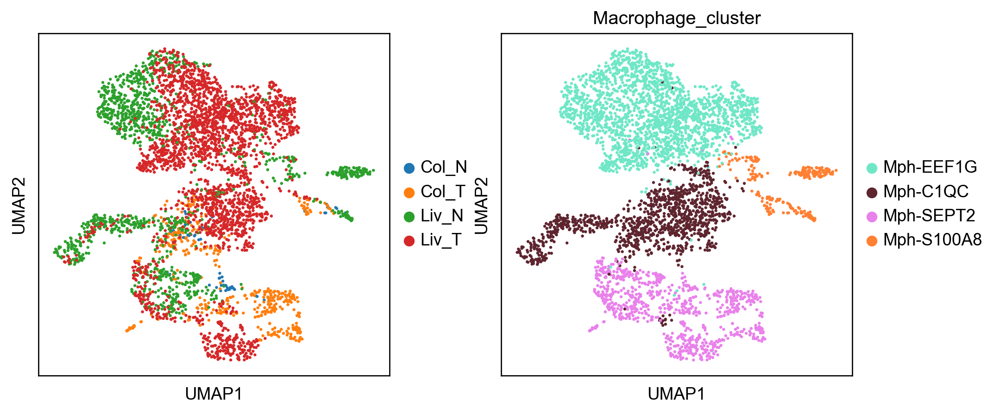

In [70]:
with rc_context({'figure.figsize': (4, 4), 'figure.facecolor':'#FFFFFF', 'savefig.dpi': '300', 'axes.grid':'False', 'legend.loc':'best'}):
    sc.pl.umap(adata, color=['batch_2nd', 'Macrophage_cluster'], ncols=2, wspace=0.2, size=15, legend_loc='right margin', show=True, title='', save="_06_Macrophage.pdf")

## Filter Marker genes

In [71]:
sc.tl.rank_genes_groups(adata, groupby='Macrophage_cluster', method='wilcoxon')

In [72]:
sc.tl.filter_rank_genes_groups(adata, min_in_group_fraction=0.25, max_out_group_fraction=0.5, min_fold_change=0.5)

In [73]:
color_loc_1 = mpl.colors.LinearSegmentedColormap.from_list('blue', [(0, '#FFFFFF'), (1, '#fd5f00')], N=256)

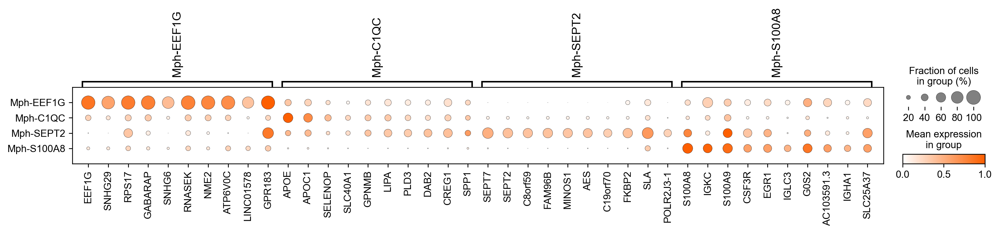

In [74]:
with rc_context({'figure.figsize': (12, 4), 'figure.facecolor':'#FFFFFF', 'savefig.dpi': '300', 'axes.grid':'False', 'legend.loc':'best'}):
    sc.pl.rank_genes_groups_dotplot(adata, n_genes=10, key='rank_genes_groups_filtered', cmap=color_loc_1, 
    dendrogram=False, standard_scale='group', save='06_Macrophage_cluster.pdf')

In [75]:
orange_color_normal = mpl.colors.LinearSegmentedColormap.from_list('blue', 
                                             [(0,    '#50C1E9'),
                                              (0.5,  '#FFFFFF'),
                                              (1,    '#fd5f00')], N=256)

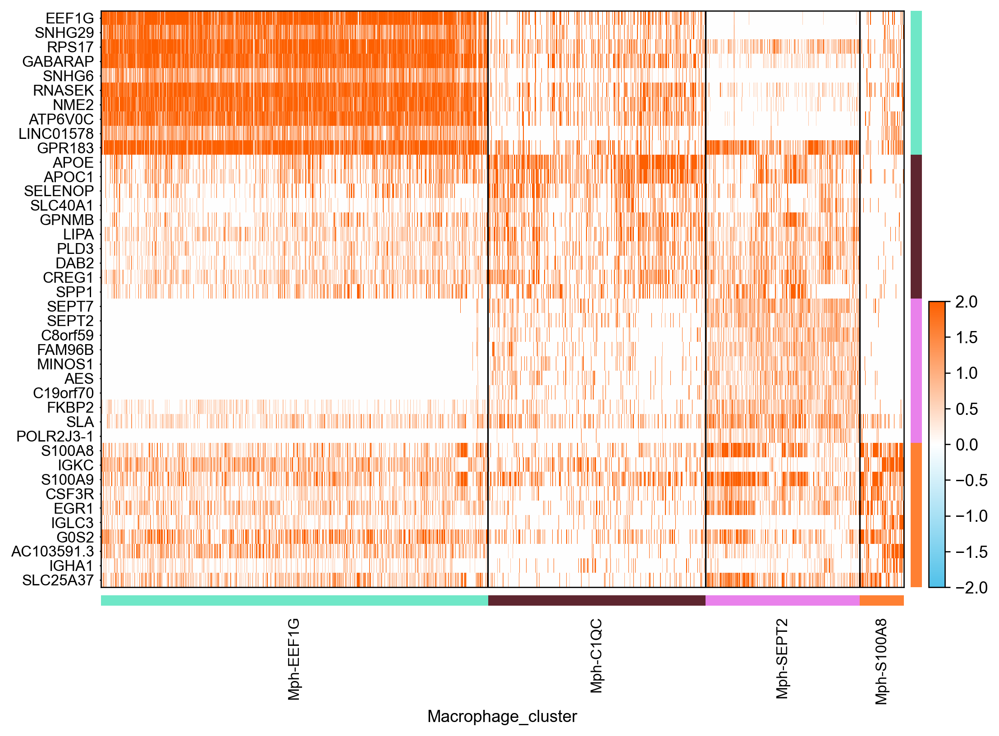

In [76]:
sc.pl.rank_genes_groups_heatmap(adata, n_genes=10, key='rank_genes_groups_filtered', show_gene_labels=True,
   use_raw=True, swap_axes=True, vmax=2, vmin=-2, cmap=orange_color_normal, dendrogram=False, save='_06_Macrophage_cluster.pdf')

## remove normal

In [77]:
# select the row, which un-including NAG
# adata = adata[adata.obs['batch_2nd'].isin(['PT', 'LN', 'OM'])].obs
adata = adata[~adata.obs['batch_2nd'].isin(['Col_N', 'Liv_N'])]

In [78]:
adata.obs['batch_2nd'].cat.categories

Index(['Col_T', 'Liv_T'], dtype='object')

In [79]:
# adata.obs['batch_2nd'].cat.reorder_categories(
#     ['PT', 'LN', 'OM'], inplace=True, ordered=True)
# adata.obs['batch_2nd'].cat.categories

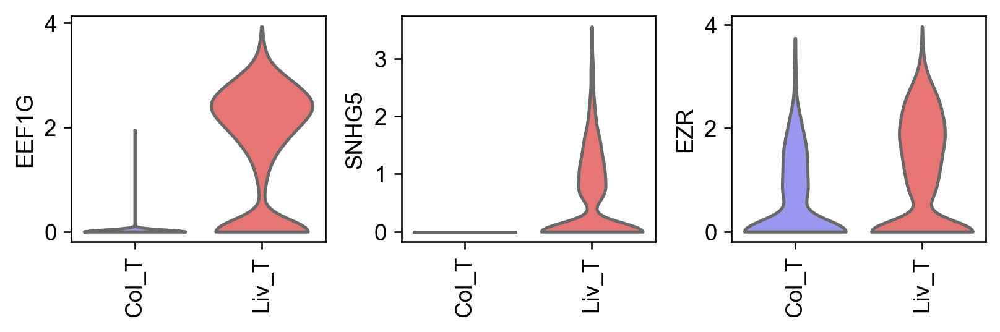

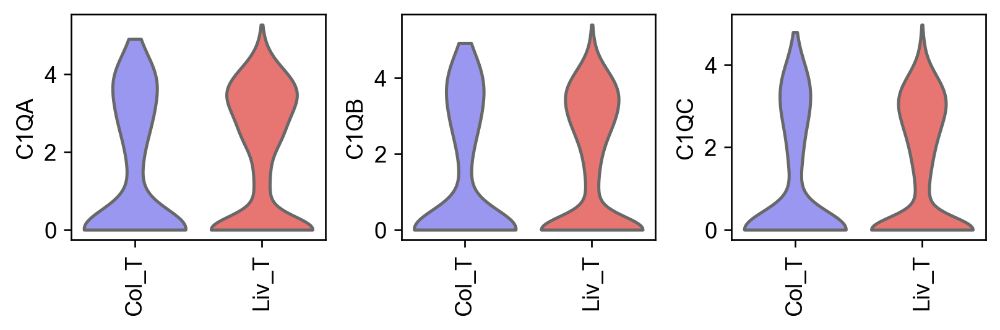

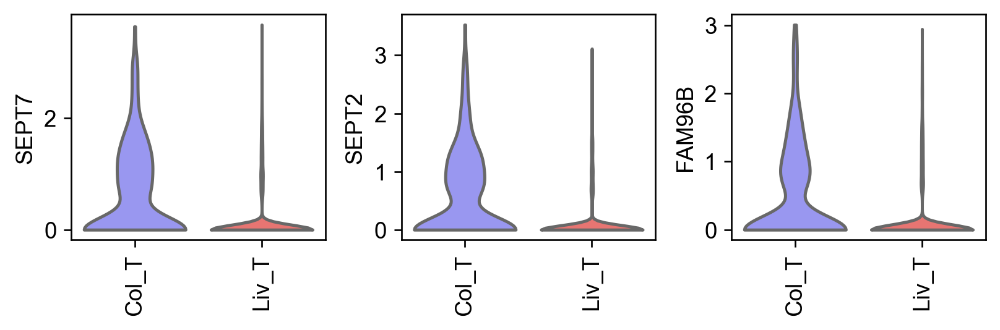

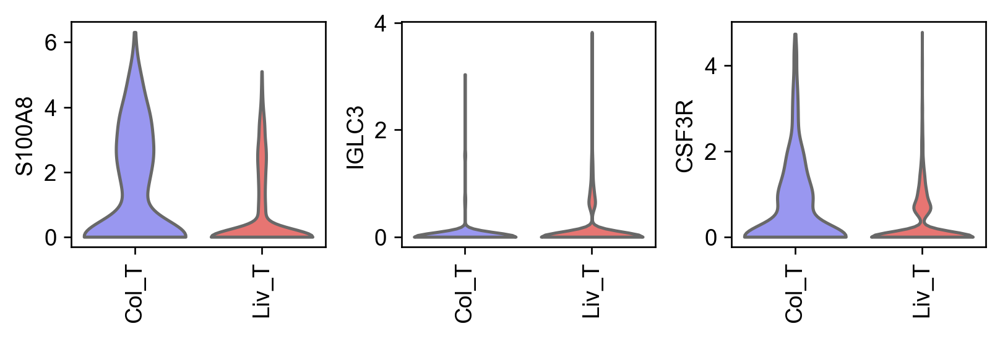

In [80]:
with rc_context({'figure.figsize': (3, 2), 'figure.facecolor':'#FFFFFF', 'savefig.dpi': '300', 'axes.grid':'False', 'legend.loc':'best'}):
    sc.pl.violin(adata, ['EEF1G', 'SNHG5', 'EZR'], groupby='batch_2nd', palette=['#8B88FF', '#fa625f'], rotation=90, swap_axes=True, stripplot=False, show=True, save="_06_1_Mph-EEF1G_v1.pdf")
    sc.pl.violin(adata, ['C1QA', 'C1QB', 'C1QC'], groupby='batch_2nd', palette=['#8B88FF', '#fa625f'], rotation=90, swap_axes=True, stripplot=False, show=True, save="_06_2_Mph-C1QC_v1.pdf")
    sc.pl.violin(adata, ['SEPT7', 'SEPT2', 'FAM96B'], groupby='batch_2nd', palette=['#8B88FF', '#fa625f'], rotation=90, swap_axes=True, stripplot=False, show=True, save="_06_3_Mph-SEPT2_v1.pdf")
    sc.pl.violin(adata, ['S100A8', 'IGLC3', 'CSF3R'], groupby='batch_2nd', palette=['#8B88FF', '#fa625f'], rotation=90, swap_axes=True, stripplot=False, show=True, save="_06_4_Mph-S100A8_v1.pdf")

In [81]:
res = pd.DataFrame(adata.obs[['batch_2nd', 'Macrophage_cluster']])
res.to_csv("32_02_Fraction_cell_type_Macrophage_del_normal_v1.csv", sep="\t")
res['batch_2nd'].value_counts()

Liv_T    2493
Col_T     474
Name: batch_2nd, dtype: int64

In [82]:
# adata.obs['batch_EBV'] = adata.obs['batch'].replace(
#     ['PT1', 'PT2', 'PT3', 'PT4', 'PT5', 'PT6', 'PT7', 'PT8', 'PT9', 'PT10', 'PT11',
#     'LN1', 'LN2', 'LN3', 'LN4', 'LN5', 'LN6', 'LN7', 'OM1'],
#     ['PT_EBV_neg', 'PT_EBV_neg', 'PT_EBV_neg', 'PT_EBV_pos', 'PT_EBV_pos', 'PT_EBV_neg', 'PT_EBV_neg', 'PT_EBV_pos', 'PT_EBV_neg', 'PT_EBV_neg', 'PT_EBV_neg',
#     'LN_EBV_pos', 'LN_EBV_pos', 'LN_EBV_neg', 'LN_EBV_neg', 'LN_EBV_neg', 'LN_EBV_neg', 'LN_EBV_neg', 'OM_EBV_neg'])

In [83]:
# adata.obs

In [84]:
# adata = adata[adata.obs['batch_EBV'].isin(['PT_EBV_neg', 'PT_EBV_pos'])]

In [85]:
# adata.obs[['Myeloid_cluster', 'batch_EBV']].value_counts()

In [86]:
# # 替换 PT_EBV_neg 为 PT EBV -, 替换 PT_EBV_pos 为 PT EBV +
# adata.obs['batch_EBV'] = adata.obs['batch_EBV'].replace('PT_EBV_neg', 'PT EBV -')
# adata.obs['batch_EBV'] = adata.obs['batch_EBV'].replace('PT_EBV_pos', 'PT EBV +')

# # 合并 Myeloid_cluster 和 batch_EBV, 并用 " " 分隔
# adata.obs['batch_exp'] = adata.obs['Myeloid_cluster'].str.cat(adata.obs['batch_EBV'], sep=" ")

# adata.obs['batch_exp'].value_counts()

In [87]:
# with rc_context({'figure.figsize': (3, 2), 'figure.facecolor':'#FFFFFF', 'savefig.dpi': '300', 'axes.grid':'False', 'legend.loc':'best'}):
#     sc.pl.violin(adata, ['FCGR3A', 'SPP1', 'IGHG1'], groupby='batch_EBV', palette=['#2470a0', '#2470a0'], rotation=90, swap_axes=True, stripplot=False, show=True, save="_07_01_M1_v1.pdf")
#     sc.pl.violin(adata, ['NFKBIA', 'CXCL2', 'CXCL8'], groupby='batch_EBV', palette=['#ED5485', '#ED5485'], rotation=90, swap_axes=True, stripplot=False, show=True, save="_07_02_M2_v1.pdf")

## Gene expression in different groups

In [88]:
# adata.obs

In [89]:
# adata

In [90]:
# adata.obs['batch_exp'].astype('category').cat.categories

In [91]:
# adata.obs['batch_exp'].astype('category').values

In [92]:
# adata.obs['batch_exp'] = adata.obs['batch_exp'].astype('category').values

In [93]:
# adata.obs['batch_exp'].cat.categories

In [94]:
# adata.obs['batch_exp'].cat.reorder_categories(
#     ['M1 PT EBV -', 'M1 PT EBV +', 'M2 PT EBV -', 'M2 PT EBV +',], inplace=True, ordered=True)

In [95]:
# adata.obs['batch_exp'].cat.categories

In [96]:
# with rc_context({'figure.figsize': (3.5, 2), 'figure.facecolor':'#FFFFFF', 'axes.grid':'False', }):
#     sc.pl.violin(adata, ['FCGR3A', 'SPP1', 'IGHG1'], groupby='batch_exp', 
#         palette=['#2470a0', '#2470a0', '#ED5485', '#ED5485'], rotation=90, swap_axes=True, stripplot=False, show=True, save="_08_01_M1_v1.pdf")
#     sc.pl.violin(adata, ['NFKBIA', 'CXCL2', 'CXCL8'], groupby='batch_exp', 
#         palette=['#2470a0', '#2470a0', '#ED5485', '#ED5485'], rotation=90, swap_axes=True, stripplot=False, show=True, save="_08_02_M2_v1.pdf")

## OM/PT

In [97]:
# adata = sc.read('/Users/xuewei/ZeroData/projects/STAD/GDPH_v3_20220919/local/write/GC_62_Macrophage.h5ad')
# adata.obs['batch_2nd'] = adata.obs['batch'].replace(
#     ['NAG1', 'NAG2', 'NAG3', 
#     'PT1', 'PT2', 'PT3', 'PT6', 'PT7', 'PT8', 'PT10', 'PT11',
#     'PT4', 'PT5', 'PT9',
#     'LN1', 'LN2', 'LN5', 'LN6', 
#     'LN3', 'LN4', 'LN7', 
#     'OM1'],
#     ['NAG', 'NAG', 'NAG', 
#     'PT', 'PT', 'PT', 'PT', 'PT', 'PT', 'PT', 'PT',
#     'PT', 'PT', 'PT',
#     'LN', 'LN', 'LN', 'LN', 
#     'LN', 'LN', 'LN', 
#     'OM'])
# adata = adata[adata.obs['Myeloid_cluster'].isin(['M1', 'M2'])]
# adata = adata[~adata.obs['batch_2nd'].isin(['NAG'])]
# adata.obs['batch_EBV'] = adata.obs['batch'].replace(
#     ['PT1', 'PT2', 'PT3', 'PT4', 'PT5', 'PT6', 'PT7', 'PT8', 'PT9', 'PT10', 'PT11',
#     'LN1', 'LN2', 'LN3', 'LN4', 'LN5', 'LN6', 'LN7', 'OM1'],
#     ['PT EBV -', 'PT EBV -', 'PT EBV -', 'PT EBV +', 'PT EBV +', 'PT EBV -', 'PT EBV -', 'PT EBV +', 'PT EBV -', 'PT EBV -', 'PT EBV -',
#     'LN EBV +', 'LN EBV +', 'LN EBV -', 'LN EBV -', 'LN EBV -', 'LN EBV -', 'LN EBV -', 'OM EBV -'])
# adata.obs['Myeloid_cluster'].astype('category').cat.categories
# adata.obs['Myeloid_cluster'].astype('category').values
# adata.obs['Myeloid_cluster'] = adata.obs['Myeloid_cluster'].astype('category').values
# adata.obs['Myeloid_cluster'].cat.categories
# adata.obs['Myeloid_cluster'].cat.reorder_categories(['M1', 'M2'], inplace=True, ordered=True)
# adata.obs['Myeloid_cluster'].cat.categories
# adata = adata[adata.obs['batch_2nd'].isin(['PT', 'OM'])]

# sc.pp.log1p(adata)
# sc.tl.rank_genes_groups(adata, 'batch_2nd', method='wilcoxon', pts=True)

In [98]:
# pd.DataFrame(adata.uns['rank_genes_groups']['names'])

In [99]:
# # OM/PT
# data=pd.DataFrame(adata.uns['rank_genes_groups']['names'])
# data=data['OM']
# marker_genes = data.values.tolist()

# genedf = sc.get.obs_df(
#         adata,
#         keys=["batch_2nd", *marker_genes],
#         use_raw=True
#     )
# grouped = genedf.groupby("batch_2nd")
# mean, sum, med, var = grouped.mean(), grouped.sum(), grouped.median(), grouped.var()

# mean = mean.T.rename(columns={'PT':'PT_mean', 'OM':'OM_mean'})
# med = med.T.rename(columns={'PT':'PT_median', 'OM':'OM_median'})
# sum = sum.T.rename(columns={'PT':'PT_sum', 'OM':'OM_sum'})
# var = var.T.rename(columns={'PT':'PT_var', 'OM':'OM_var'})

# join = pd.concat([mean, med, sum, var], axis=1)

# res = sc.get.rank_genes_groups_df(adata, group="OM")
# res = res.set_index('names')

# exp = pd.concat([res, join], axis=1, join='outer')
# exp.to_csv("62_diff_Macrophage_OM_vs_PT_exp.csv")

In [100]:
# res_enrich = sc.get.rank_genes_groups_df(adata, group='OM')
# res_enrich = sc.queries.enrich(adata, "OM")
# res_enrich.to_csv("62_diff_Macrophage_res_OM_vs_PT_enrich.csv")

In [101]:
# sc.get.obs_df(adata, keys=['batch_2nd', 'SPP1'], use_raw=True)[genedf['batch_2nd'] == 'PT']['SPP1'].mean()

In [102]:
# sc.get.obs_df(adata, keys=['batch_2nd', 'SPP1'], use_raw=True)[genedf['batch_2nd'] == 'OM']['SPP1'].mean()

## EBV+ and EBV–

In [103]:
# adata.obs['batch_EBV'].value_counts()

In [104]:
# adata.obs['batch_EBV'].astype('category').cat.categories

In [105]:
# adata.obs['batch_EBV'].astype('category').values
# adata.obs['batch_EBV'] = adata.obs['batch_EBV'].astype('category').values
# adata.obs['batch_EBV'].cat.categories
# adata.obs['batch_EBV'].cat.reorder_categories(['PT EBV +', 'PT EBV -', 'OM EBV -'], inplace=True, ordered=True)
# adata.obs['batch_EBV'].cat.categories

In [106]:
# with rc_context({'figure.figsize': (4, 4), 'figure.facecolor':'#FFFFFF', 'axes.grid':'False', 'legend.loc':'best'}):
#     sc.pl.umap(adata, color=['batch_EBV'], ncols=3, wspace=0.4, palette=['#f06966', '#79BEDB', '#1F6ED4'], legend_loc='right margin', legend_fontsize=15, size=30, 
#     show=True, title='', save='_11_Macrophage_EBV.pdf')

In [107]:
# sc.tl.rank_genes_groups(adata, 'batch_EBV', method='wilcoxon', pts=True)
# sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False, show=True)

In [108]:
# res = sc.get.rank_genes_groups_df(adata, group='PT EBV +')
# res.to_csv("62_diff_10_Macrophage_res_PT_EBV_pos_df.csv")

# res_enrich = sc.get.rank_genes_groups_df(adata, group='PT EBV +')
# res_enrich = sc.queries.enrich(adata, "PT EBV +")
# res_enrich.to_csv("62_diff_10_Macrophage_res_PT_EBV_pos_enrich.csv")

# res = sc.get.rank_genes_groups_df(adata, group='PT EBV -')
# res.to_csv("62_diff_11_Macrophage_res_PT_EBV_neg_df.csv")

# res_enrich = sc.get.rank_genes_groups_df(adata, group='PT EBV -')
# res_enrich = sc.queries.enrich(adata, "PT EBV -")
# res_enrich.to_csv("62_diff_11_Macrophage_res_PT_EBV_neg_enrich.csv")

# res = sc.get.rank_genes_groups_df(adata, group='OM EBV -')
# res.to_csv("62_diff_12_Macrophage_res_OM_EBV_neg_df.csv")

# res_enrich = sc.get.rank_genes_groups_df(adata, group='OM EBV -')
# res_enrich = sc.queries.enrich(adata, "OM EBV -")
# res_enrich.to_csv("62_diff_12_Macrophage_res_OM_EBV_neg_enrich.csv")

In [109]:
# sc.pl.stacked_violin(adata, 
#     ['MMP9', 'TGFBI', 'IL7R',
#     'TIAM1', 'SERPINB9', 'MAP4K4',
#     'IFI27', 'LY6E', 'FN1',], 
#     stripplot=False, values_to_plot='logfoldchanges', row_palette=['#f06966', '#79BEDB', '#1F6ED4'], figsize=(9,3), 
#     vmax=1, vmin=-1, swap_axes=False, groupby='batch_EBV', rotation=90, show=True, save='2_EBV_all_exp.pdf')

In [110]:
# with rc_context({'figure.figsize': (3.5, 2), 'figure.facecolor':'#FFFFFF', 'axes.grid':'False', }):
#     sc.pl.violin(adata, ['MMP9', 'TGFBI', 'IL7R'], groupby='batch_EBV', palette=['#f06966', '#79BEDB', '#1F6ED4'], 
#     rotation=90, swap_axes=True, stripplot=False, show=True, save="_62_4_PT_EBV_pos_v1.pdf")
#     sc.pl.violin(adata, ['TIAM1', 'SERPINB9', 'MAP4K4'], groupby='batch_EBV', palette=['#f06966', '#79BEDB', '#1F6ED4'], 
#     rotation=90, swap_axes=True, stripplot=False, show=True, save="_62_4_PT_EBV_neg_v1.pdf")

## Gene expression of LASSO signature genes

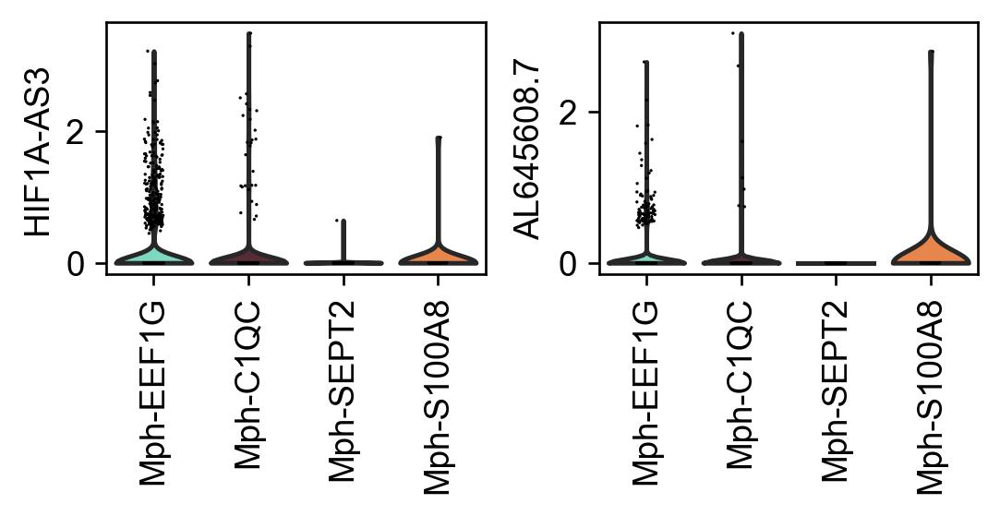

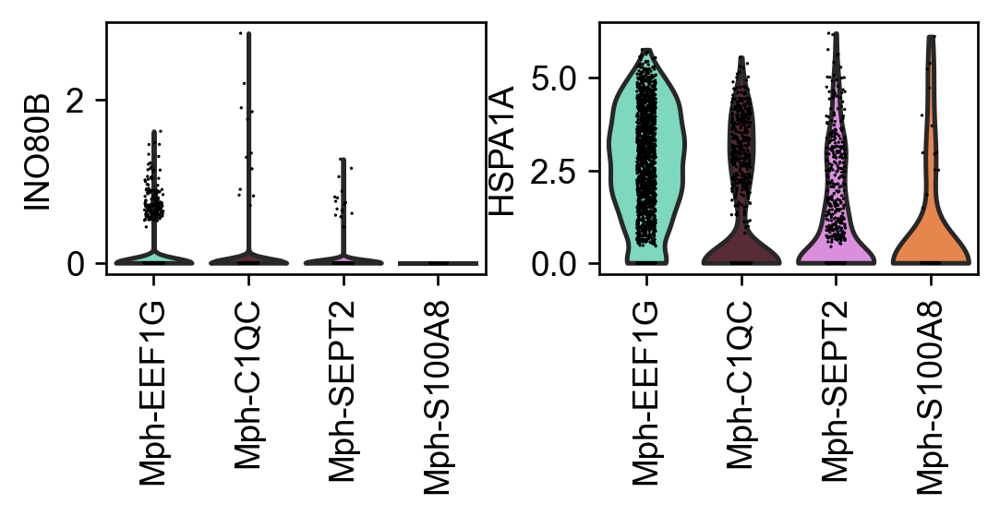

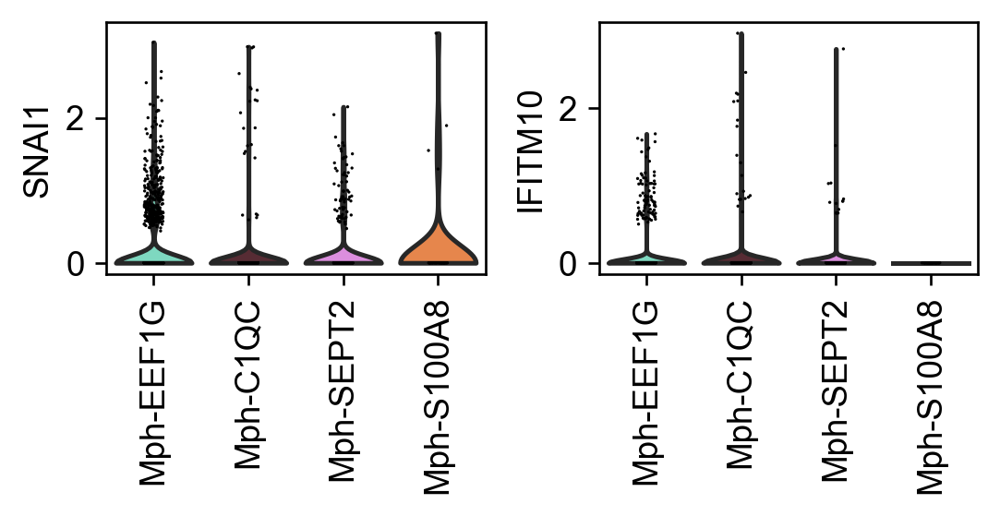

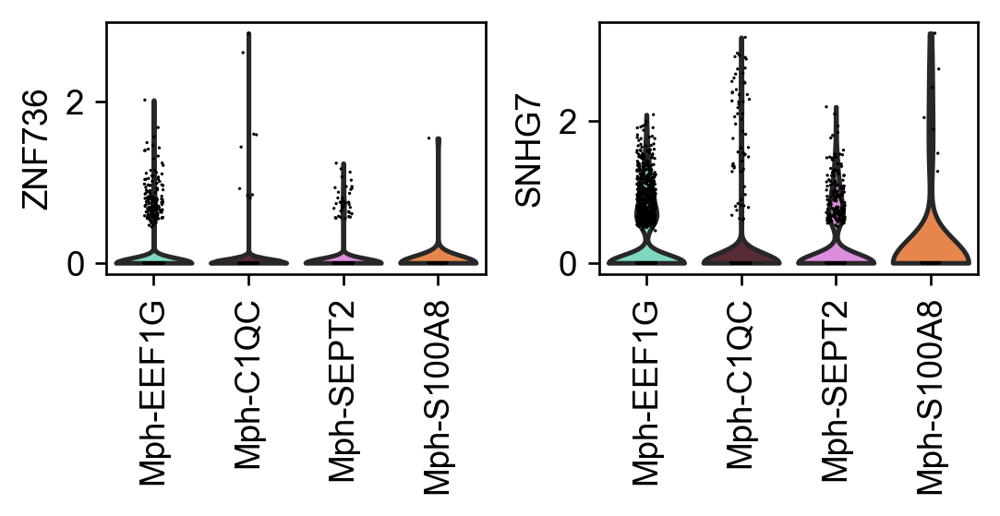

In [138]:
with rc_context({'figure.figsize': (3, 1.5), 'figure.facecolor':'#FFFFFF', 'savefig.dpi': '300', 'axes.grid':'False', 'legend.loc':'best'}):
    sc.pl.violin(adata, ['HIF1A-AS3', 'AL645608.7'], groupby='Macrophage_cluster', rotation=90, swap_axes=True, show=True)
    sc.pl.violin(adata, ['INO80B', 'HSPA1A'], groupby='Macrophage_cluster', rotation=90, swap_axes=True, show=True)
    sc.pl.violin(adata, ['SNAI1', 'IFITM10'], groupby='Macrophage_cluster', rotation=90, swap_axes=True, show=True)
    sc.pl.violin(adata, ['ZNF736', 'SNHG7'], groupby='Macrophage_cluster', rotation=90, swap_axes=True, show=True)

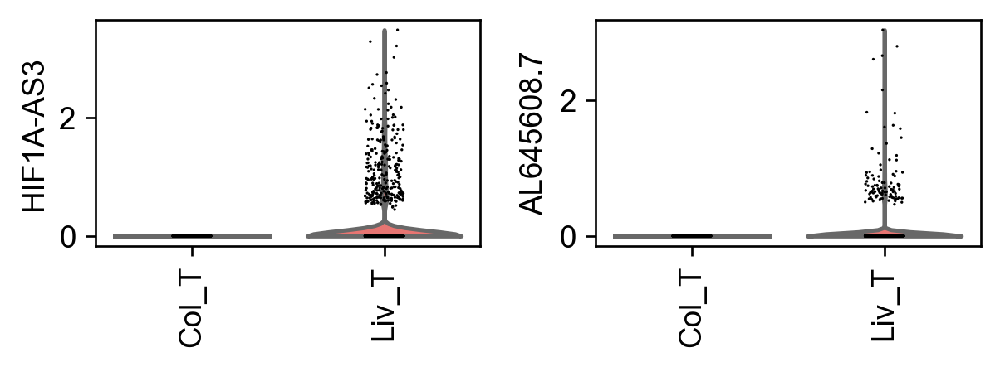

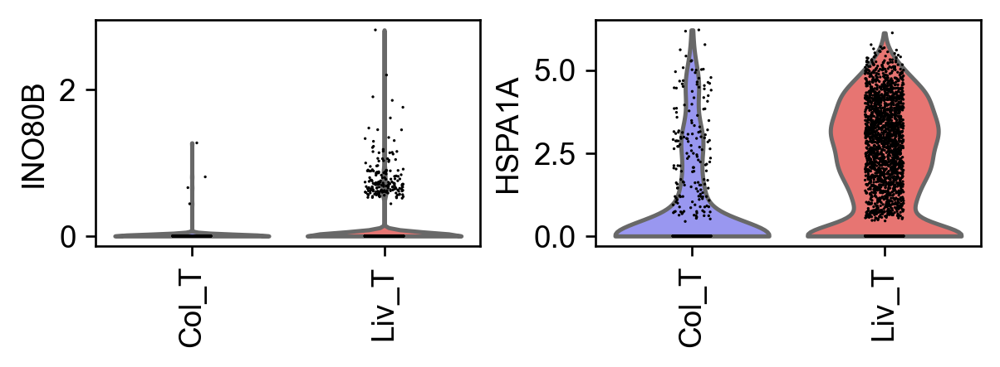

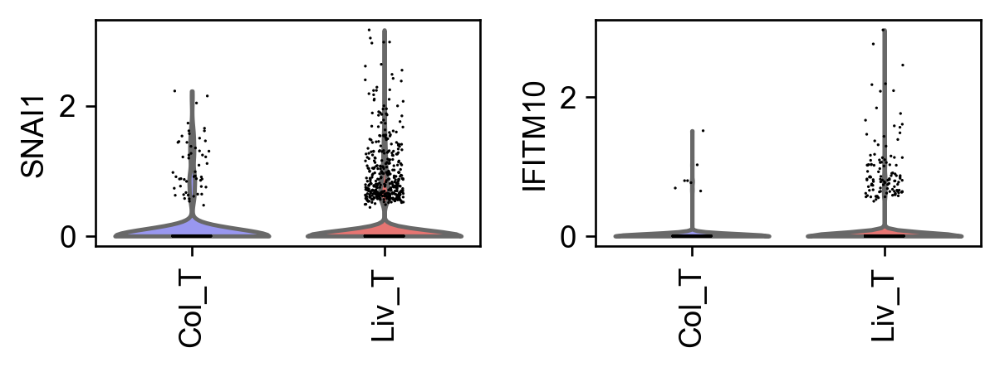

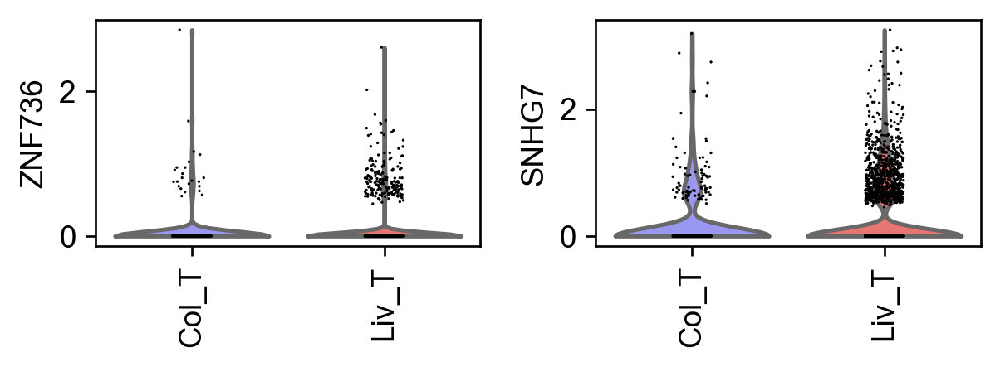

In [139]:
with rc_context({'figure.figsize': (3.2, 1.5), 'figure.facecolor':'#FFFFFF', 'savefig.dpi': '300', 'axes.grid':'False', 'legend.loc':'best'}):
    sc.pl.violin(adata, ['HIF1A-AS3', 'AL645608.7'], groupby='batch_2nd', palette=['#8B88FF', '#fa625f'], rotation=90, swap_axes=True, show=True, save="_07_1_LASSO_batch_2nd.pdf")
    sc.pl.violin(adata, ['INO80B', 'HSPA1A'], groupby='batch_2nd', palette=['#8B88FF', '#fa625f'], rotation=90, swap_axes=True, show=True, save="_07_2_LASSO_batch_2nd.pdf")
    sc.pl.violin(adata, ['SNAI1', 'IFITM10'], groupby='batch_2nd', palette=['#8B88FF', '#fa625f'], rotation=90, swap_axes=True, show=True, save="_07_3_LASSO_batch_2nd.pdf")
    sc.pl.violin(adata, ['ZNF736', 'SNHG7'], groupby='batch_2nd', palette=['#8B88FF', '#fa625f'], rotation=90, swap_axes=True, show=True, save="_07_4_LASSO_batch_2nd.pdf")
    # stripplot=False

In [128]:
# with rc_context({'figure.figsize': (6, 2), 'figure.facecolor':'#FFFFFF', 'savefig.dpi': '300', 'axes.grid':'False', 'legend.loc':'best'}):
#     sc.pl.stacked_violin(adata, ['HIF1A-AS3', 'AL645608.7', 'INO80B', 'HSPA1A', 'SNAI1', 'IFITM10', 'ZNF736', 'SNHG7'], 
#                          groupby='Macrophage_cluster', values_to_plot='logfoldchanges', var_group_rotation=90, rotation=0, vmax=1, vmin=-1, figsize=(6, 2),
#                          row_palette=['#6fe7c7', '#5e252f', '#e981eb', '#ff8033'], 
#                          standard_scale='var', mean_only_expressed=True, swap_axes=False, dendrogram=False, show=True)
#     sc.pl.stacked_violin(adata, ['HIF1A-AS3', 'AL645608.7', 'INO80B', 'HSPA1A', 'SNAI1', 'IFITM10', 'ZNF736', 'SNHG7'], 
#                          groupby='batch_2nd', values_to_plot='logfoldchanges', var_group_rotation=90, rotation=0, vmax=1, vmin=-1, figsize=(6, 2),
#                          row_palette=['#8B88FF', '#fa625f'], 
#                          standard_scale='var', mean_only_expressed=True, swap_axes=False, dendrogram=False, show=True)

In [132]:
# with rc_context({'figure.figsize': (3, 1.5), 'figure.facecolor':'#FFFFFF', 'savefig.dpi': '300', 'axes.grid':'False', 'legend.loc':'best'}):
#     sc.pl.violin(adata, ['SNAI1', 'SNAI2'], groupby='Macrophage_cluster', rotation=90, swap_axes=True, show=True)
#     sc.pl.violin(adata, ['TWIST1', 'TWIST2'], groupby='Macrophage_cluster', rotation=90, swap_axes=True, show=True)
#     sc.pl.violin(adata, ['CDH1', 'CDH2'], groupby='Macrophage_cluster', rotation=90, swap_axes=True, show=True)
#     sc.pl.violin(adata, ['VIM', 'FN1'], groupby='Macrophage_cluster', rotation=90, swap_axes=True, show=True)
#     sc.pl.violin(adata, ['ZEB1', 'ZEB2'], groupby='Macrophage_cluster', rotation=90, swap_axes=True, show=True)

In [131]:
# with rc_context({'figure.figsize': (3, 1.5), 'figure.facecolor':'#FFFFFF', 'savefig.dpi': '300', 'axes.grid':'False', 'legend.loc':'best'}):
#     sc.pl.violin(adata, ['SNAI1', 'SNAI2'], groupby='batch_2nd', palette=['#8B88FF', '#fa625f'], rotation=90, swap_axes=True, show=True)
#     sc.pl.violin(adata, ['TWIST1', 'TWIST2'], groupby='batch_2nd', palette=['#8B88FF', '#fa625f'], rotation=90, swap_axes=True, show=True)
#     sc.pl.violin(adata, ['CDH1', 'CDH2'], groupby='batch_2nd', palette=['#8B88FF', '#fa625f'], rotation=90, swap_axes=True, show=True)
#     sc.pl.violin(adata, ['VIM', 'FN1'], groupby='batch_2nd', palette=['#8B88FF', '#fa625f'], rotation=90, swap_axes=True, show=True)
#     sc.pl.violin(adata, ['ZEB1', 'ZEB2'], groupby='batch_2nd', palette=['#8B88FF', '#fa625f'], rotation=90, swap_axes=True, show=True)
#     # stripplot=False

In [135]:
# with rc_context({'figure.figsize': (6, 2), 'figure.facecolor':'#FFFFFF', 'savefig.dpi': '300', 'axes.grid':'False', 'legend.loc':'best'}):
#     sc.pl.stacked_violin(adata, ['HIF1A-AS3', 'AL645608.7', 'INO80B', 'HSPA1A', 'SNAI1', 'IFITM10', 'ZNF736', 'SNHG7'], 
#                          groupby='Macrophage_cluster', values_to_plot='logfoldchanges', var_group_rotation=90, rotation=0, vmax=1, vmin=-1, figsize=(6, 2),
#                          row_palette=['#6fe7c7', '#5e252f', '#e981eb', '#ff8033'], 
#                          standard_scale='var', mean_only_expressed=True, swap_axes=False, dendrogram=False, show=True)
#     sc.pl.stacked_violin(adata, ['HIF1A-AS3', 'AL645608.7', 'INO80B', 'HSPA1A', 'SNAI1', 'IFITM10', 'ZNF736', 'SNHG7'], 
#                          groupby='batch_2nd', values_to_plot='logfoldchanges', var_group_rotation=90, rotation=0, vmax=1, vmin=-1, figsize=(6, 2),
#                          row_palette=['#8B88FF', '#fa625f'], 
#                          standard_scale='var', mean_only_expressed=True, swap_axes=False, dendrogram=False, show=True)